# AIML Module Project - Ensemble Technique - Aaditya Kumar Ravi

• ***DOMAIN:*** Telecom  
• ***CONTEXT:*** A telecom company wants to use their historical customer data and leverage machine learning to predict behaviour in an attempt
to retain customers. The end goal is to develop focused customer retention programs  
• ***DATA DESCRIPTION:*** Each row represents a customer, each column contains customer’s attributes described on the column Metadata. The 
data set includes information about:  
• Customers who left within the last month – the column is called Churn  
• Services that each customer has signed up for – phone, multiple lines, internet, online security, online backup, device protection, tech support, and 
streaming TV and movies  
• Customer account information – how long they’ve been a customer, contract, payment method, paperless billing, monthly charges, and total charges  
• Demographic info about customers – gender, age range, and if they have partners and dependents  
• ***PROJECT OBJECTIVE:*** The objective, as a data scientist hired by the telecom company, is to build a model that will help to identify the 
potential customers who have a higher probability to churn. This will help the company to understand the pain points and patterns of customer 
churn and will increase the focus on strategising customer retention  
• ***STEPS AND TASK [60 Marks]:***

##### 1. Data Understanding & Exploration: [5 Marks]

In [765]:
# import important libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

##### A. Read ‘TelcomCustomer-Churn_1.csv’ as a DataFrame and assign it to a variable. [1 Mark]

In [766]:
tcc1 = pd.read_csv('TelcomCustomer-Churn_1.csv')

In [767]:
#read the head to see if data is loaded in tcc1
tcc1.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No


##### B. Read ‘TelcomCustomer-Churn_2.csv’ as a DataFrame and assign it to a variable. [1 Mark]

In [768]:
tcc2 = pd.read_csv('TelcomCustomer-Churn_2.csv')

In [769]:
#read the head to see if data is loaded in tcc2
tcc2.head()

,customerID,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


##### C. Merge both the DataFrames on key ‘customerID’ to form a single DataFrame [2 Mark]

In [770]:
tcc = pd.merge(tcc1, tcc2, on="customerID", how="inner")

In [771]:
#read the head to see if merged data is loaded in tcc
tcc.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [772]:
tcc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


* We can see that both the dataframes are merged based on customerId as it has columns belonging to both the dataframes from beginning to the end

##### D. Verify if all the columns are incorporated in the merged DataFrame by using simple comparison Operator in Python. [1 Marks]

In [773]:
#we will use set here so that customerID won't be counted twice when we append tcc2 column list in tcc1 columns.   
#we are using set on tcc.columns as well so that order will be maintained while comparing the sets.   
#In addition, we can add one more conditions to match the count for number of columns in both the sets and merged one which
#is not necessarily required. tcc.shape[1] == (tcc1.shape[1]+tcc2.shape[1])-1
#We can count the rows with (tcc.shape[0]==tcc1.shape[0]==tcc2.shape[0]) for all the dataframes

if (set(tcc.columns)==set(tcc1.columns.append(tcc2.columns))) and (tcc.shape[1]==(tcc1.shape[1]+tcc2.shape[1])-1) and (tcc.shape[0]==tcc1.shape[0]==tcc2.shape[0]):
    print("All columns are incorporated in merged DataFrame.")
else:
    print("All columns are not incorporated in merged DataFrame.")

All columns are incorporated in merged DataFrame.


In [774]:
#Let us view the columns of tcc1 and tcc2
set(tcc1.columns.append(tcc2.columns))

{'Churn',
 'Contract',
 'Dependents',
 'DeviceProtection',
 'InternetService',
 'MonthlyCharges',
 'MultipleLines',
 'OnlineBackup',
 'OnlineSecurity',
 'PaperlessBilling',
 'Partner',
 'PaymentMethod',
 'PhoneService',
 'SeniorCitizen',
 'StreamingMovies',
 'StreamingTV',
 'TechSupport',
 'TotalCharges',
 'customerID',
 'gender',
 'tenure'}

In [775]:
#Let us view the columns of tcc
set(tcc.columns)

{'Churn',
 'Contract',
 'Dependents',
 'DeviceProtection',
 'InternetService',
 'MonthlyCharges',
 'MultipleLines',
 'OnlineBackup',
 'OnlineSecurity',
 'PaperlessBilling',
 'Partner',
 'PaymentMethod',
 'PhoneService',
 'SeniorCitizen',
 'StreamingMovies',
 'StreamingTV',
 'TechSupport',
 'TotalCharges',
 'customerID',
 'gender',
 'tenure'}

* We can see the columns of tcc1 and tcc2 dataframes and tcc are matching. 

##### 2. Data Cleaning & Analysis: [15 Marks]
##### A. Impute missing/unexpected values in the DataFrame. [2 Marks] 

In [776]:
tcc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [777]:
tcc.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

* We see none of the columns has null values.
* All the columns are of object datatype except 3 columns(SeniorCitizen, tenure, MonthlyCharges) which is numeric type    
* Let us check for unexpected values in the each column

In [778]:
#see the unique valuee and its counts in each column of the dataframe
for col in tcc.columns:
    print(tcc[str(col)].value_counts())
    print('===================================')

7590-VHVEG    1
3791-LGQCY    1
6008-NAIXK    1
5956-YHHRX    1
5365-LLFYV    1
             ..
9796-MVYXX    1
2637-FKFSY    1
1552-AAGRX    1
4304-TSPVK    1
3186-AJIEK    1
Name: customerID, Length: 7043, dtype: int64
Male      3555
Female    3488
Name: gender, dtype: int64
0    5901
1    1142
Name: SeniorCitizen, dtype: int64
No     3641
Yes    3402
Name: Partner, dtype: int64
No     4933
Yes    2110
Name: Dependents, dtype: int64
1     613
72    362
2     238
3     200
4     176
     ... 
28     57
39     56
44     51
36     50
0      11
Name: tenure, Length: 73, dtype: int64
Yes    6361
No      682
Name: PhoneService, dtype: int64
No                  3390
Yes                 2971
No phone service     682
Name: MultipleLines, dtype: int64
Fiber optic    3096
DSL            2421
No             1526
Name: InternetService, dtype: int64
No                     3498
Yes                    2019
No internet service    1526
Name: OnlineSecurity, dtype: int64
No                     3088
Yes

* We see that all the columns has appropriate categorical values, only 3 columns(tenure, MonthlyCharges, TotalCharges) have continuous data which has chances of unexpected values.

In [779]:
contDataCols = ['tenure','MonthlyCharges','TotalCharges']
for col in contDataCols:
    print(col,"Null value count:",tcc[col].isnull().sum())
    print(col,"Empty value count:",(tcc[col]=='').sum())
    print(col,"Space value count:",(tcc[col]==' ').sum())

tenure Null value count: 0
tenure Empty value count: 0
tenure Space value count: 0
MonthlyCharges Null value count: 0
MonthlyCharges Empty value count: 0
MonthlyCharges Space value count: 0
TotalCharges Null value count: 0
TotalCharges Empty value count: 0
TotalCharges Space value count: 11


* TotalCharges column has 11 values with space. Let us read those values.

In [780]:
tcc.loc[tcc['TotalCharges']==' ']

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,...,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,...,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,...,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,No


**Here we got the unexpected value which is blank space. Let us impute this with mean value**

In [781]:
# Replace one blank space with null value so that we can impute that with mean value
tcc['TotalCharges'] = tcc['TotalCharges'].replace(' ',np.nan)

In [782]:
from sklearn.impute import SimpleImputer
tcImputer = SimpleImputer(strategy='mean')
tcc['TotalCharges']=tcImputer.fit_transform(tcc[['TotalCharges']])

In [783]:
tcc.loc[tcc['TotalCharges']==' ']

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn


* We can see empty value in TotalCharges has been imputed to mean value
* Let us drop the customerID column as well which is of no use

In [784]:
#drop the column not going to be in use
tcc.drop('customerID', axis=1, inplace=True)

In [785]:
tcc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7043 non-null   object 
 1   SeniorCitizen     7043 non-null   int64  
 2   Partner           7043 non-null   object 
 3   Dependents        7043 non-null   object 
 4   tenure            7043 non-null   int64  
 5   PhoneService      7043 non-null   object 
 6   MultipleLines     7043 non-null   object 
 7   InternetService   7043 non-null   object 
 8   OnlineSecurity    7043 non-null   object 
 9   OnlineBackup      7043 non-null   object 
 10  DeviceProtection  7043 non-null   object 
 11  TechSupport       7043 non-null   object 
 12  StreamingTV       7043 non-null   object 
 13  StreamingMovies   7043 non-null   object 
 14  Contract          7043 non-null   object 
 15  PaperlessBilling  7043 non-null   object 
 16  PaymentMethod     7043 non-null   object 


* We can see customerID column is deleted

##### B. Make sure all the variables with continuous values are of ‘Float’ type. [2 Marks]

* Looking at the above values count list in each column, continuous values are tenure, Monthly charges and total charges
* Rest all columns are numerical representation of categorical values, so they are not continuous. 
* So we will convert tenure, MonthylyCharges and TotalCharges to float values

In [786]:
for col in ['tenure','MonthlyCharges','TotalCharges']:
    tcc[col] = tcc[col].astype('float')

In [787]:
tcc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7043 non-null   object 
 1   SeniorCitizen     7043 non-null   int64  
 2   Partner           7043 non-null   object 
 3   Dependents        7043 non-null   object 
 4   tenure            7043 non-null   float64
 5   PhoneService      7043 non-null   object 
 6   MultipleLines     7043 non-null   object 
 7   InternetService   7043 non-null   object 
 8   OnlineSecurity    7043 non-null   object 
 9   OnlineBackup      7043 non-null   object 
 10  DeviceProtection  7043 non-null   object 
 11  TechSupport       7043 non-null   object 
 12  StreamingTV       7043 non-null   object 
 13  StreamingMovies   7043 non-null   object 
 14  Contract          7043 non-null   object 
 15  PaperlessBilling  7043 non-null   object 
 16  PaymentMethod     7043 non-null   object 


**Observations:**
* We can see all values are not null now 
* All continuous values are also of float datatype
* It got converted to float type as it does not have any unexpected values i.e special chars.

##### C. Create a function that will accept a DataFrame as input and return pie-charts for all the appropriate Categorical features. Clearly show percentage distribution in the pie-chart. [4 Marks]

In [788]:
#Let us view all the columns and it's values
for col in tcc.columns:
    print(tcc[str(col)].value_counts())
    print('===================================')

Male      3555
Female    3488
Name: gender, dtype: int64
0    5901
1    1142
Name: SeniorCitizen, dtype: int64
No     3641
Yes    3402
Name: Partner, dtype: int64
No     4933
Yes    2110
Name: Dependents, dtype: int64
1.0     613
72.0    362
2.0     238
3.0     200
4.0     176
       ... 
28.0     57
39.0     56
44.0     51
36.0     50
0.0      11
Name: tenure, Length: 73, dtype: int64
Yes    6361
No      682
Name: PhoneService, dtype: int64
No                  3390
Yes                 2971
No phone service     682
Name: MultipleLines, dtype: int64
Fiber optic    3096
DSL            2421
No             1526
Name: InternetService, dtype: int64
No                     3498
Yes                    2019
No internet service    1526
Name: OnlineSecurity, dtype: int64
No                     3088
Yes                    2429
No internet service    1526
Name: OnlineBackup, dtype: int64
No                     3095
Yes                    2422
No internet service    1526
Name: DeviceProtection, dtype

* Looking at the above value counts of each column, we find that all the features are categorical features except a few like customerID, tenure, MonthlyCharges, TotalCharges

In [789]:
def plot_piechart(df):
    '''
    df: Dataframe
    '''
    #All features including int for SeniorCitizen
    categorical_columns = df.select_dtypes(include=['object', 'int']).columns 

    num_columns = 3 #3 pie charts in a row for better readibility
    num_rows = int(len(categorical_columns)/num_columns) + 1 #to fit 17 pie charts in this case, 3 in each row, total 6 rows

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 5 * num_rows))
    axes = axes.flatten() #to convert the 2x2 array of subplots into a one-dimensional array

    for i, col in enumerate(categorical_columns):
        category_counts = df[col].value_counts()

        # Plot the pie chart on the corresponding subplot
        axes[i].pie(category_counts, labels=category_counts.index, autopct="%1.1f%%", startangle=90)
        axes[i].set_title(f'{col} Distribution')

    # Hide blank subplots of the last row
    for i in range(len(categorical_columns), len(axes)):
        axes[i].axis('off')

    plt.tight_layout() #to adjust the overlapping on title and subplots
    plt.show()


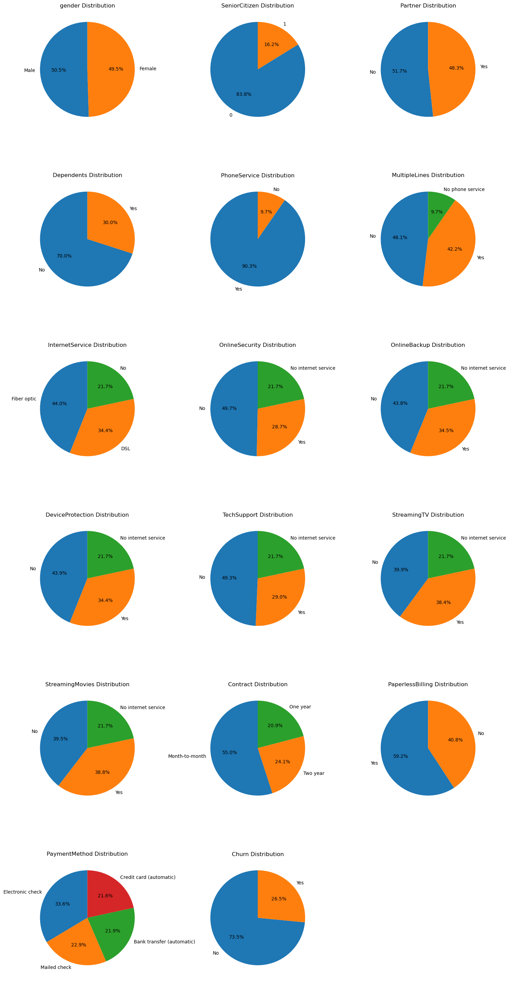

In [790]:
plot_piechart(tcc)

##### D. Share insights for Q2.c. [2 Marks]

**Insights from the above Pie Charts:**  
* Customer Gender is having almost equal distribution. Male customer is 50.5% and Female is 49.5%
* 16.2% people are SeniorCitizen and 83.8% are not senior citizen which is the majority.
* Customer having No Partner is having 51.7% whereas Partner Yes is having 48.3%. Yes is slightly less than No but almost equal.
* 30% customers are Dependents, 70% are not Dependents
* 90.3% are having Phone Service, whereas 9.7% are not having Phone service
* 42.2% are having MultipleLines, 48.1% are having no MultipleLines whereas 9.7% are having even no phone service,so multiple lines are not applicable for them.
* Majority 44% customer use Fiber optic for internet service, 34.4% use DSL and 21.7% have not even Internet service
* Majority 49.7% customer don't have Online security, 28.7% has and 21.7% have not even internet service, Online security is not applicable for them. 
* 34.5% do have online backup, 43.8% do not have online backup and 21.7% do not have internet service
* 34.4% have device protection, 43.9% do not have device protection and 21.7% do not have internet servcie
* 29% don't have Tech support, 49.3% do have tech support and 21.7% do not have internet servcie
* 38.4% have streaming TV, 39.9% do not have Streaming TV and 21.7% do not have internet service
* 38.8% have streaming Movies, 39.5% don't have streaming movies and 21.7% do not have internet service
* 3 types of contracts are there: Month-to-month, One Year, Two Years. Majority 55% are having Month-to-month contract, 20.9% are having One Year contract, 24.1% are having Two year contract.
* 59.2% customer accept paperless billing, 40.8% have not paperless billing.
* PaymentMethod is of 4 types here: Electronic Check, Mailed check, Bank transfer(automatic), Credit card(automatic). Majority is Electronic check 33.6%, then Mailed check 22.9%, then bank transfer 21.9% and then credit card 21.6%
* 73.5% have No Churn, 26.5% have Yes Churn 

##### E. Encode all the appropriate Categorical features with the best suitable approach. [2 Marks]

In [791]:
#see the unique valuee and its counts in each column of the dataframe
for col in tcc.columns:
    print(tcc[str(col)].value_counts())
    print('===================================')

Male      3555
Female    3488
Name: gender, dtype: int64
0    5901
1    1142
Name: SeniorCitizen, dtype: int64
No     3641
Yes    3402
Name: Partner, dtype: int64
No     4933
Yes    2110
Name: Dependents, dtype: int64
1.0     613
72.0    362
2.0     238
3.0     200
4.0     176
       ... 
28.0     57
39.0     56
44.0     51
36.0     50
0.0      11
Name: tenure, Length: 73, dtype: int64
Yes    6361
No      682
Name: PhoneService, dtype: int64
No                  3390
Yes                 2971
No phone service     682
Name: MultipleLines, dtype: int64
Fiber optic    3096
DSL            2421
No             1526
Name: InternetService, dtype: int64
No                     3498
Yes                    2019
No internet service    1526
Name: OnlineSecurity, dtype: int64
No                     3088
Yes                    2429
No internet service    1526
Name: OnlineBackup, dtype: int64
No                     3095
Yes                    2422
No internet service    1526
Name: DeviceProtection, dtype

**Observations:**
* we have already dropped customerId 
* We can do one hot encoding with gender, PaymentMethod as there is no ordinal relationships in case of gender and PaymentMethod
* SeniorCitizen values(0,1) are fine.
* Partner, Dependents,PhoneService, PaperlessBilling, Churn have values No, Yes which can be mapped to 0, 1 respectively as we have for SeniorCitizen column
* tenure,MonthyCharges,TotalCharges values are fine
* MultipleLines can be mapped to 0,1 for No, Yes respectively and -1 for No phone service
* InternetService can be mappped to 0 for No, 1 for DSL, 2 for Fiber optic
* OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies can be mapped to 0,1,-1 for No, Yes, No internet service respectively
* Contract can be mapped to 1 for Month-to-month, 2 for One year, 3 for Two year

In [792]:
# Map columns having No Yes values to 0,1 respectively
mapTo01Cols = ['Partner','Dependents','PhoneService','PaperlessBilling','Churn']
for col in mapTo01Cols:
    tcc[col] = tcc[col].map({'No': 0, 'Yes': 1})

# Map MultipleLines No, Yes, No phone service value to 0, 1, -1 respectively
tcc['MultipleLines'] = tcc['MultipleLines'].map({'No': 0, 'Yes': 1, 'No phone service': -1})

# Map InternetService No,DSL,Fiber optic values to 0,1,2 respecitvely
tcc['InternetService'] = tcc['InternetService'].map({'No': 0, 'DSL': 1, 'Fiber optic': 2})

# Map columns having No,Yes,No internet service values to 0, 1, -1 respectively
mapto01Minus1Cols = ['OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport','StreamingTV','StreamingMovies']
for col in mapto01Minus1Cols:
    tcc[col] = tcc[col].map({'No': 0, 'Yes': 1, 'No internet service': -1})
    
# Map Contract values to numbers as below
tcc['Contract'] = tcc['Contract'].map({'Month-to-month': 1, 'One year': 2, 'Two year': 3})

# One hot encoding for gender and paymentmethod as there is no ordinal relationship in values of these columns
tcc = pd.get_dummies(tcc, columns=['gender'], prefix=['gender'], drop_first=True)
tcc = pd.get_dummies(tcc, columns=['PaymentMethod'], prefix=['PayMethod']) #here we will not do dropFirst because it has more than 2 values.

In [793]:
# Let us view the dataset now
tcc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 23 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   SeniorCitizen                        7043 non-null   int64  
 1   Partner                              7043 non-null   int64  
 2   Dependents                           7043 non-null   int64  
 3   tenure                               7043 non-null   float64
 4   PhoneService                         7043 non-null   int64  
 5   MultipleLines                        7043 non-null   int64  
 6   InternetService                      7043 non-null   int64  
 7   OnlineSecurity                       7043 non-null   int64  
 8   OnlineBackup                         7043 non-null   int64  
 9   DeviceProtection                     7043 non-null   int64  
 10  TechSupport                          7043 non-null   int64  
 11  StreamingTV                   

In [794]:
tcc.shape

(7043, 23)

**Observations:**
* we can see the total column now is 23 after one hot encoding, label encoding and deletion of customerID columns
* We don't have any null values as we have total 7043 entries and all are not null 
* We can see that now all the columns have numeric value only.

##### G. Normalize/Standardize the data with the best suitable approach. [2 Marks]
* Note: Answer of question 2.F is after G's answer. 

* Let us plot the graph for numerical columns to see if it follows Gaussian/normal like distribution. so that we can decide whether to do standardization or normalization

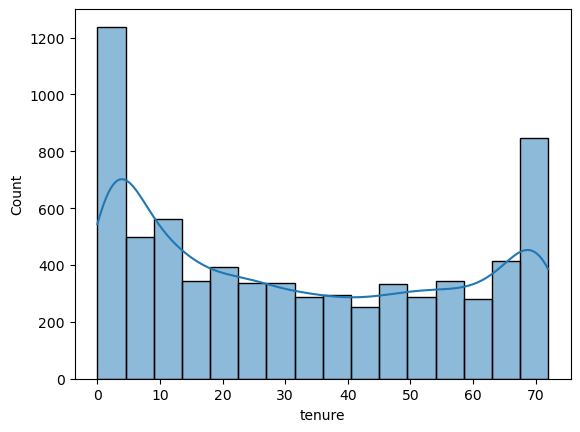

In [795]:
sns.histplot(tcc, x='tenure', kde=True);

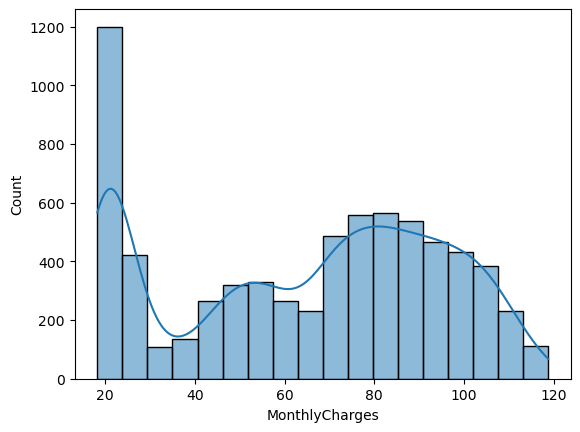

In [796]:
sns.histplot(tcc, x='MonthlyCharges', kde=True);

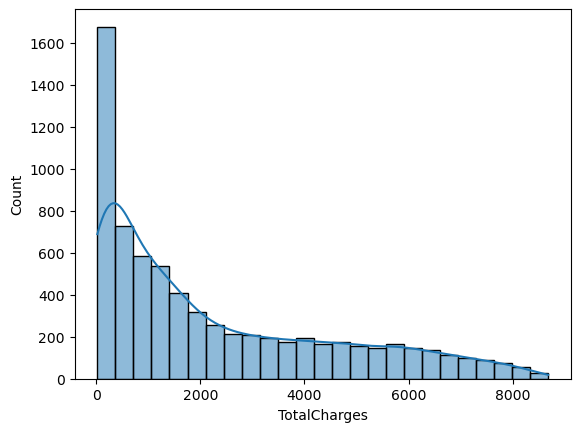

In [797]:
sns.histplot(tcc, x='TotalCharges', kde=True);

**Observations:**
* Above plots are approximately Gaussian/normal distribution i.e having sysmetric and bell shaped pattern. Hence we will use standardization technique for numerical columns using StandardScaler() and will not use MinMaxScaler() here for normalization.

In [798]:
# we have already encoded categorical columns. so here we wil standardized numerical columns tenure, MonthlyCharges, 
# TotalCharges
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
cols_to_standardize = ['tenure','MonthlyCharges','TotalCharges']
tcc[cols_to_standardize] = ss.fit_transform(tcc[cols_to_standardize])

In [799]:
#Let us view the standardized data in dataframe
tcc.loc[:, ['tenure','MonthlyCharges','TotalCharges']]

,tenure,MonthlyCharges,TotalCharges
0,-1.277445,-1.160323,-0.994971
1,0.066327,-0.259629,-0.173876
2,-1.236724,-0.362660,-0.960399
3,0.514251,-0.746535,-0.195400
4,-1.236724,0.197365,-0.941193
...,...,...,...
7038,-0.340876,0.665992,-0.129281
7039,1.613701,1.277533,2.242808
7040,-0.870241,-1.168632,-0.855182
7041,-1.155283,0.320338,-0.872777


* We have normalized the numerical columns   
* **Note:** We have moved the normalization part above the train test split, so that we can make split based on standardized data.

##### F. Split the data into 80% train and 20% test. [1 Marks]

In [800]:
#Split the data in X and Y
#Considering the target variable is column Churn
X=tcc.drop('Churn',axis=1)
Y=tcc['Churn']

In [801]:
#Verify X having no Churn column
X.head()

,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,...,StreamingMovies,Contract,PaperlessBilling,MonthlyCharges,TotalCharges,gender_Male,PayMethod_Bank transfer (automatic),PayMethod_Credit card (automatic),PayMethod_Electronic check,PayMethod_Mailed check
0,0,1,0,-1.277445,0,-1,1,0,1,0,...,0,1,1,-1.160323,-0.994971,0,0,0,1,0
1,0,0,0,0.066327,1,0,1,1,0,1,...,0,2,0,-0.259629,-0.173876,1,0,0,0,1
2,0,0,0,-1.236724,1,0,1,1,1,0,...,0,1,1,-0.362660,-0.960399,1,0,0,0,1
3,0,0,0,0.514251,0,-1,1,1,0,1,...,0,2,0,-0.746535,-0.195400,1,1,0,0,0
4,0,0,0,-1.236724,1,0,2,0,0,0,...,0,1,1,0.197365,-0.941193,0,0,0,1,0


In [802]:
#verify Y having only Churn values
Y.head()

0    0
1    0
2    1
3    0
4    1
Name: Churn, dtype: int64

In [803]:
from sklearn.model_selection import train_test_split
#Split the data into 80% train and 20% test
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=1, stratify=Y)

In [804]:
#Let us verify the data size of X_train, Y_train, X_test, Y_test if it is split in 80:20 ratio
print("X_train size(in percentage):",X_train.shape[0]*100/X.shape[0])
print("Y_train size(in percentage):",Y_train.shape[0]*100/Y.shape[0])

print("X_test size(in percentage):",X_test.shape[0]*100/X.shape[0])
print("Y_test size(in percentage):",Y_test.shape[0]*100/Y.shape[0])

X_train size(in percentage): 79.99432060201619
Y_train size(in percentage): 79.99432060201619
X_test size(in percentage): 20.005679397983815
Y_test size(in percentage): 20.005679397983815


In [805]:
Y.value_counts(normalize=True)

0    0.73463
1    0.26537
Name: Churn, dtype: float64

* Value distribution percentage of the target variable Churn is 73:26 for 0 and 1 respectively.

**Note: Question G answered before question F answer.**

##### 3. Model building and performance improvement : [40 Marks]
##### A. Train a model using Decision tree and check the performance of the model on train and test data ( 4 marks )

In [806]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics

dtcModel = DecisionTreeClassifier(criterion='gini',random_state=1) #build the model
dtcModel.fit(X_train, Y_train) #train the model

DecisionTreeClassifier(random_state=1)

In [807]:
#defining this variable to record the performance of each model. This is for further model perofrmance summary comparision
performance_summary_all = pd.DataFrame(columns=[
    'Method', 'train_accuracy', 'train_recall', 'train_precision', 'train_f1',
    'test_accuracy', 'test_recall', 'test_precision', 'test_f1'
])

In [808]:
''' 
    Defining a generic method to predict and print different performance metrics(Accuracy, Precision, Recall, F1-Score), 
    classification report and confustion matrix. We will use this method throughout this project.
'''
def predict_perfscore_confmatrix(model, method):
    '''
    Predict & Print performance scores and confusion matrix for a classifier model.

    Parameters:
    - model: Classifier model
    - method: model name for testing.E.g-DecisionTreeWithRegularization,DecisionTreeGridSearch etc
    '''
    global performance_summary_all

    pred_train = model.predict(X_train) #predit on training data
    pred_test = model.predict(X_test)   #predit on testing data
    
    train_accuracy = model.score(X_train, Y_train) #score on training data
    test_accuracy = model.score(X_test, Y_test)    #score on testing data
    
    train_recall = metrics.recall_score(Y_train, pred_train) #recall on training data
    test_recall = metrics.recall_score(Y_test, pred_test)    #recall on testing data
    
    train_precision = metrics.precision_score(Y_train, pred_train) #precision on training data
    test_precision = metrics.precision_score(Y_test, pred_test)    #precision on testing data
    
    train_f1 = metrics.f1_score(Y_train, pred_train) #f1 score on training data
    test_f1 = metrics.f1_score(Y_test, pred_test)    #f1 score on testing data
    
    new_result = pd.DataFrame({
        'Method': [method],
        'train_accuracy': [train_accuracy],
        'train_recall': [train_recall],
        'train_precision': [train_precision],
        'train_f1': [train_f1],
        'test_accuracy': [test_accuracy],
        'test_recall': [test_recall],
        'test_precision': [test_precision],
        'test_f1': [test_f1]
    })
    # Concatenate new_result dataframe to existing global performance_summary_all which is used to record perforamnces of 
    # each run. This variable will be used further whenever we want to do the comparision on performances of each run.
    performance_summary_all = pd.concat([performance_summary_all, new_result], ignore_index=True)
    # It should not duplicate values of same method when we re-run. it should keep the latest one and drop all previous ones.
    performance_summary_all.drop_duplicates(subset='Method', keep='last')
    
    print("================Performance Score================")
    print("Accuracy on training dataset : ", train_accuracy)
    print("Accuracy on test dataset : ", test_accuracy)
    
    print("\nRecall on training dataset : ", train_recall)
    print("Recall on test dataset : ", test_recall)
    
    print("\nPrecision on training dataset : ", train_precision)
    print("Precision on test dataset : ", test_precision)
    
    print("\nF1-Score on training dataset : ", train_f1)
    print("F1-Score on test dataset : ", test_f1)
    
    print("\n================Classfication Report for test data=============")
    print(metrics.classification_report(Y_test, pred_test)) 
    
    print("\n================Confusion Matrix for test data=================")
    cm = metrics.confusion_matrix(Y_test, pred_test, labels=[1,0])
    df_cm = pd.DataFrame(cm, index=[i for i in [1,0]], columns=[i for i in ['Pred 1', 'Pred 0']])
    plt.figure(figsize=(4,2))
    sns.heatmap(df_cm, annot=True, fmt='g')


================Performance Score================
Accuracy on training dataset :  0.9978700745473909
Accuracy on test dataset :  0.7359829666430092

Recall on training dataset :  0.9919732441471572
Recall on test dataset :  0.5

Precision on training dataset :  1.0
Precision on test dataset :  0.5026881720430108

F1-Score on training dataset :  0.9959704499664204
F1-Score on test dataset :  0.5013404825737265

================Classfication Report for test data=============
              precision    recall  f1-score   support

           0       0.82      0.82      0.82      1035
           1       0.50      0.50      0.50       374

    accuracy                           0.74      1409
   macro avg       0.66      0.66      0.66      1409
weighted avg       0.74      0.74      0.74      1409


================Confusion Matrix for test data=================


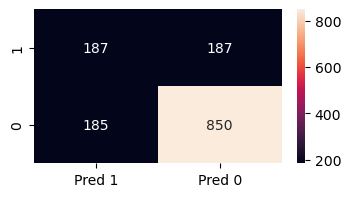

In [809]:
#predict and print performance matrices for above Decision Tree Classifier Model
predict_perfscore_confmatrix(dtcModel,'DecisionTree')

**Insights:**
* Accuracy on training 99.7% is very good but we don't see that much accuracy 73.5% on test data. which is leading towards overfit. 
* Recall, Precision and F1 score is not at all good on test data. Peforamnce on training data is around 99% but on testing data around 50%. It is definetly an overfit becuase here we have high drop in performance of testing data compared to training data. 
* In a customer retention scenario, where the goal is to proactively identify and address potential churn, recall becomes more critical and it has to be better than this score.
* If we look at the classification report, precision 82%, recall 82%, f1-score 82% for Churn 0 is Ok. but for Churn 1, precision 50%, recall 50%, f1-score 50% which is very low. which together makes an avg of 66% for total and an accuracy of 74%. 
* If we look at confusion matrix, True Positive is 187 and True Negative is 850. but False positive 185 and False Negative 187 is quite high which needs to be reduced. 

In [810]:
from sklearn.tree import plot_tree

In [881]:
'''
    Defining a generic method to visualize the decision tree which we will use throughout this project
''' 
def visualize_tree(model, tree_index=0, tree_colindex=0):
    '''
    Visualize the decision tree for a classification model 
    
    Parameters:
    - model: Classifier model
    - tree_index: default 0: used to specify tree of what index to visualize. Used for ensemble techniques
    '''
    fn = list(X_train) #list of feature names in X_train
    cn = ['0', '1']    #target column values
    fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4, 4), dpi=1000)
    
    if isinstance(model, DecisionTreeClassifier):
        plot_tree(model, feature_names = fn, class_names=cn, filled = True)
    elif isinstance(model, GradientBoostingClassifier):
        tree = model.estimators_[tree_index][tree_colindex]
        plot_tree(tree, feature_names = fn, class_names=cn, filled = True) 
    else:
        tree = model.estimators_[tree_index]
        plot_tree(tree, feature_names = fn, class_names=cn, filled = True) 

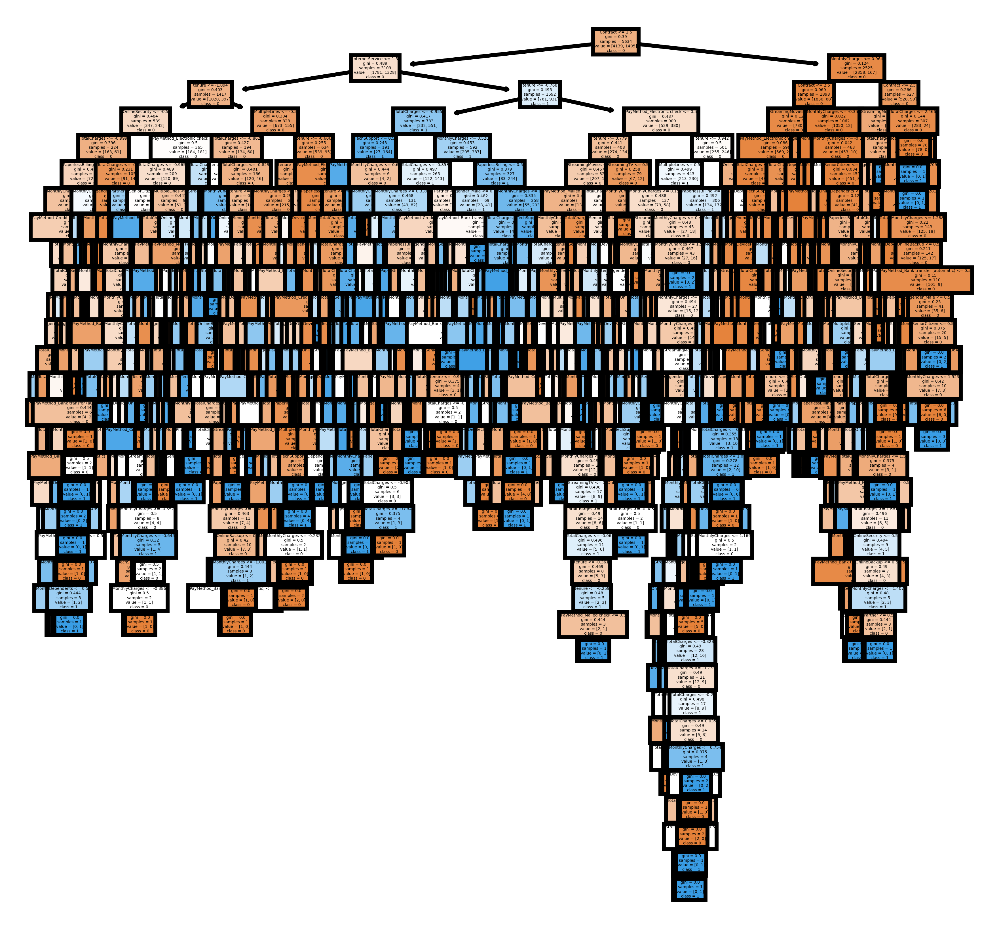

In [812]:
#visualize the tree for above decision tree classifier
visualize_tree(dtcModel)

* The decision tree is very complex which is leading to overfit. So Let us apply regularization technique to reducing the overfit.

In [813]:
dtcModel_R = DecisionTreeClassifier(criterion='gini', max_depth=5, random_state=1) #build the model with regularization, applying max-depth 3 for the tree
dtcModel_R.fit(X_train, Y_train)

DecisionTreeClassifier(max_depth=5, random_state=1)

================Performance Score================
Accuracy on training dataset :  0.8001419950301739
Accuracy on test dataset :  0.7906316536550745

Recall on training dataset :  0.5846153846153846
Recall on test dataset :  0.5614973262032086

Precision on training dataset :  0.6337926033357505
Precision on test dataset :  0.6158357771260997

F1-Score on training dataset :  0.6082115518441197
F1-Score on test dataset :  0.5874125874125875

================Classfication Report for test data=============
              precision    recall  f1-score   support

           0       0.85      0.87      0.86      1035
           1       0.62      0.56      0.59       374

    accuracy                           0.79      1409
   macro avg       0.73      0.72      0.72      1409
weighted avg       0.79      0.79      0.79      1409


================Confusion Matrix for test data=================


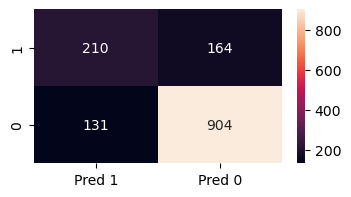

In [814]:
#Predit and print performance matrices for Decision Tree Classifier Model
predict_perfscore_confmatrix(dtcModel_R,'DecisionTreeAfterRegularization')

**Insights:**
* Performance score is now better after regularization compared to last decision tree classifier model.
* Accuracy on training 80% and test data 79%, which is good and is not an overfit now. but of course there is scope of improvement.
* Recall(58.4% on training, 56.1% on test), Precision(63.3% on training, 61.5% on test) and F1 score(60.8% on training, 58.7% on test) is better than previous.
* If we look at the classification report, precision 85%, recall 87%, f1-score 86% for Churn 0 is Ok. but for Churn 1, precision 62%, recall 56%, f1-score 59% which is better than previous.They together make an avg of 73% for precision and 72% for recall and f1-score and an accuracy of 79%. 
* If we look at confusion matrix, True Positive is 210 and True Negative is 904. but False positive 131 and False Negative 164 which is lower than previous model. that's good. 
* Since overall score of this regularized model is better. Hence we will consider this regularized decision tree classifier model for further comparisions and improvements on this model.

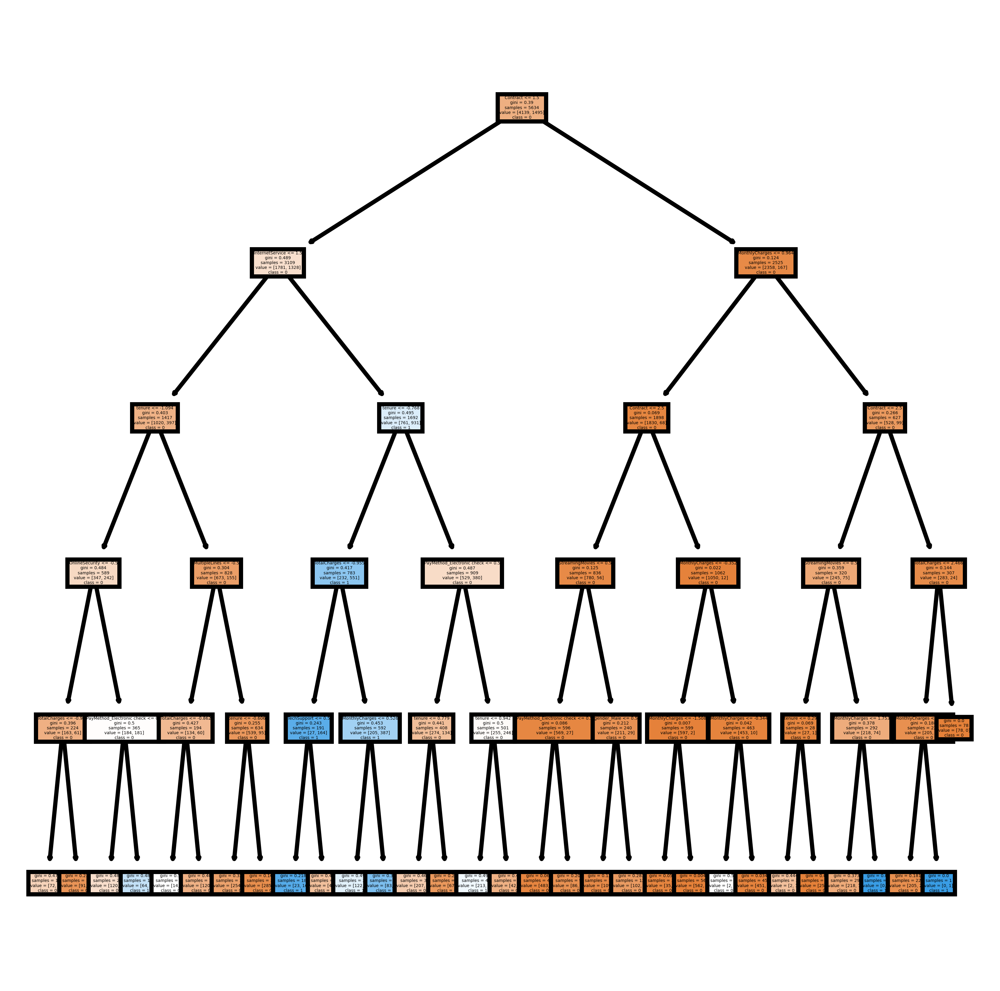

In [815]:
#visualize the tree for above decision tree classifier
visualize_tree(dtcModel_R)

##### B. Use grid search and improve the performance of the Decision tree model , check the performance of the model on train and test data , provide the differences observed in performance in Q3.a and Q3.b ( 5 marks )

In [816]:
#import required library for GridSearchCV
from sklearn.model_selection import GridSearchCV 

* In case of Decision Tree Classifier model, we can tune a few common hyperparameters like max_depth, min_samples_split, min_samples_leaf, criterion which impacts the performance of the model.
* We have already tested 2 scenarios:
    * Default one: when we did not specify any of these hyperparameter. In that case it took default values for max_depth=None, min_samples_split=2, min_samples_leaf=1, criterion='gini'
    * Regularized one: Here we specified max_depth=5 and rest parameters were default i.e min_samples_split=2, min_samples_leaf=1, criterion='gini'
* (max_depth,min_samples_split,min_samples_leaf, criterion) as (None, 2, 1, gini) and (5, 2, 1, gini) is done, but still we will keep None and 5 for max_depth in below param_grid so that other combinations of min_samples_split and min_samples_leaf and criterion can be tried in GridSearchCV.     

In [817]:
param_grid = {
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}
dtc_GS = DecisionTreeClassifier()
gscv = GridSearchCV(dtc_GS, param_grid, cv=5, scoring='recall') # cv-no of folds, scoring-recall as I want search on improved recall.
gscv.fit(X_train, Y_train)

print("Best Hyperparameters:", gscv.best_params_)
print("Best Cross-validated Score:", gscv.best_score_)

# Use the best model to make predictions
best_dtcModel_GSCV = gscv.best_estimator_

Best Hyperparameters: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best Cross-validated Score: 0.5732441471571906


================Performance Score================
Accuracy on training dataset :  0.7996095136670217
Accuracy on test dataset :  0.7906316536550745

Recall on training dataset :  0.5852842809364549
Recall on test dataset :  0.5641711229946524

Precision on training dataset :  0.6322254335260116
Precision on test dataset :  0.6151603498542274

F1-Score on training dataset :  0.6078499478985759
F1-Score on test dataset :  0.5885634588563459

================Classfication Report for test data=============
              precision    recall  f1-score   support

           0       0.85      0.87      0.86      1035
           1       0.62      0.56      0.59       374

    accuracy                           0.79      1409
   macro avg       0.73      0.72      0.72      1409
weighted avg       0.79      0.79      0.79      1409


================Confusion Matrix for test data=================


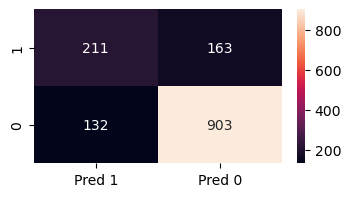

In [818]:
#Predit and print performance matrices for GridSearched Decision Tree Classifier Model
predict_perfscore_confmatrix(best_dtcModel_GSCV,'DecisionTreeAfterGridSearch')

**Insights:**
* After doing GridSearch for DecisionTreeClassifier model, we found the best HyperParameters for this model considering best recall:  
* Best Hyperparameters: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}
* Considering this hyperparameters our performance score has improved after regularization and GridSearchCV and has reduced overfit.
* Performance score is now better compared to last decision tree classifier model.
* Accuracy on training 79.96% and test data 79.06%, which is good and is not an overfit now. 
* Recall(58.5% on training, 56.4% on test), Precision(63.2% on training, 61.5% on test) and F1 score(60.7% on training, 58.8% on test) is better than previous.
* If we look at the classification report, precision 85%, recall 87%, f1-score 86% for Churn 0 is Ok. For Churn 1, precision 62%, recall 56%, f1-score 59% .They together make an avg of 73% for precision and 72% for recall and f1-score and an accuracy of 79%. 
* If we look at confusion matrix, True Positive is 211 and True Negative is 903. but False positive 132 and False Negative 163.
* Overall score of this GridsSearched model is better. 


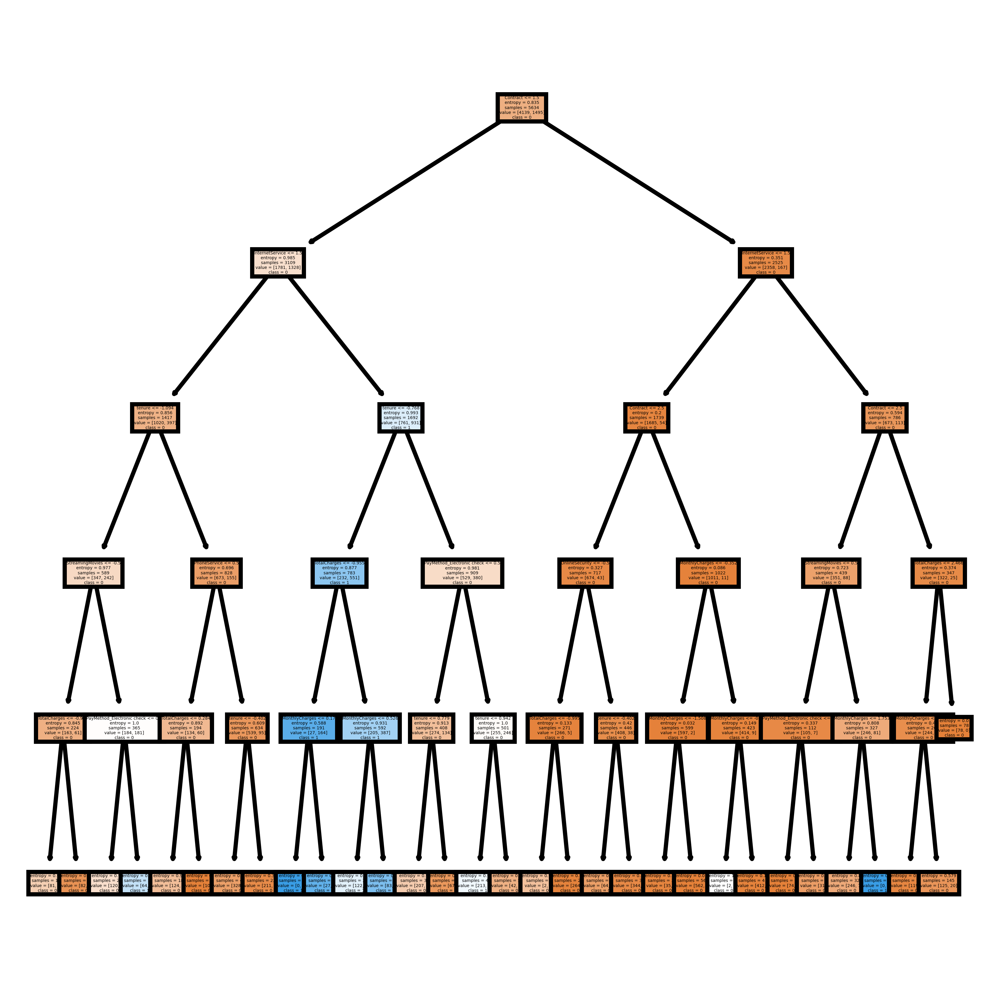

In [821]:
#Visualize the tree for the model made after grid search on Decision Tree Classifier 
visualize_tree(best_dtcModel_GSCV)

#### Let us see the summary of so far perforamances of all the DecisionTreeClassifiers for better comparision:

In [819]:
performance_summary_all

,Method,train_accuracy,train_recall,train_precision,train_f1,test_accuracy,test_recall,test_precision,test_f1
0,DecisionTree,0.997870,0.991973,1.000000,0.995970,0.735983,0.500000,0.502688,0.501340
1,DecisionTreeAfterRegularization,0.800142,0.584615,0.633793,0.608212,0.790632,0.561497,0.615836,0.587413
2,DecisionTreeAfterGridSearchCV,0.799610,0.585284,0.632225,0.607850,0.790632,0.564171,0.615160,0.588563


**Insights:**
* For the first Decision Tree Classifier model, all the perforamnce scores achieving almost perfect accuracy, recall, precision and f1-score on training data but test data predictions were not up to the mark and was significanly lower whch shows it was an overfit model.
* We applied regularization on DecisionTreeClassifier to reduce overfit issue where we gave max_depth=5 in parameter and it shown good results.Now the model is not at all an overfit as if we see 2nd row DecisionTreeAfterRegularization we have 80.01% accuracy,58.4% recall, 63.3% precision and 60.08% on training data and on test data also we have almost similar performance 79.06% accuracy, 56.14% recall, 61.5% precision and 58.7% f1 score which is quite better than previous simple decision tree model with default paramters. but of course considering the scope of improvement on recall value.
* Then we did GridSearchCV to find the best model with hypertuned parameters considering scoring parameter as recall. we found the best model with hypertuned parameters.  
  'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2
 * if we see the improvement on 3rd model, overfitting is even more reduced than 2nd one as we see training accuracy and testing accuracy difference is even lesser than 2nd one and the accuracy on test data is similar to 2nd one. Same case with recall, precision and f1-score. Hence DecisionTreeAfterGridSearchCV i.e 3rd one is the best model so far.

##### C. Train a model using Random forest and check the performance of the model on train and test data ( 4 marks )

In [824]:
from sklearn.ensemble import RandomForestClassifier

rfcModel = RandomForestClassifier(random_state=1) #build the model
rfcModel = rfcModel.fit(X_train, Y_train) #train the model

================Performance Score================
Accuracy on training dataset :  0.9976925807596734
Accuracy on test dataset :  0.7906316536550745

Recall on training dataset :  0.9953177257525083
Recall on test dataset :  0.47593582887700536

Precision on training dataset :  0.9959839357429718
Precision on test dataset :  0.6425992779783394

F1-Score on training dataset :  0.9956507193041151
F1-Score on test dataset :  0.5468509984639017

================Classfication Report for test data=============
              precision    recall  f1-score   support

           0       0.83      0.90      0.86      1035
           1       0.64      0.48      0.55       374

    accuracy                           0.79      1409
   macro avg       0.73      0.69      0.71      1409
weighted avg       0.78      0.79      0.78      1409


================Confusion Matrix for test data=================


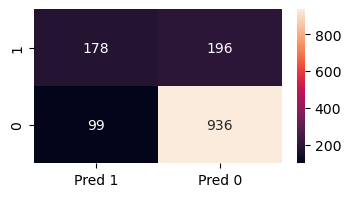

In [825]:
#Predit and print performance matrices for Random Forest Classifier Model
predict_perfscore_confmatrix(rfcModel, 'RandomForest')

**Insights:**
* Accuracy on training data is 99.7% which is perfect but accuracy of test data is 79.06% which is ok and has scope of improvement.
* Recall, Precision and F1 score is more than 99.5% on training data which is perfect but test data performance is not up to the mark. On testing data recall(47.59%), precision(64.25%) and f1-score(54.68%) which is very poor and shows overfitting.
* We need to work on this further by tuning hyperparameter to improve the perofrmance, we will try GridSearchCV.
* If we look at the classification report, precision 83%, recall 90%, f1-score 86% for Churn 0 is good. but for Churn 1, precision 64%, recall 48%, f1-score 55% which is very low. which together makes an avg of 73%, 69% and 71% respectively for precision, recall and f1-score and an accuracy of 79%. 
* If we look at confusion matrix, 
    * True Positive is 178 and True Negative is 936. 
    * False positive 99 and False Negative 196 which should be reduced. 

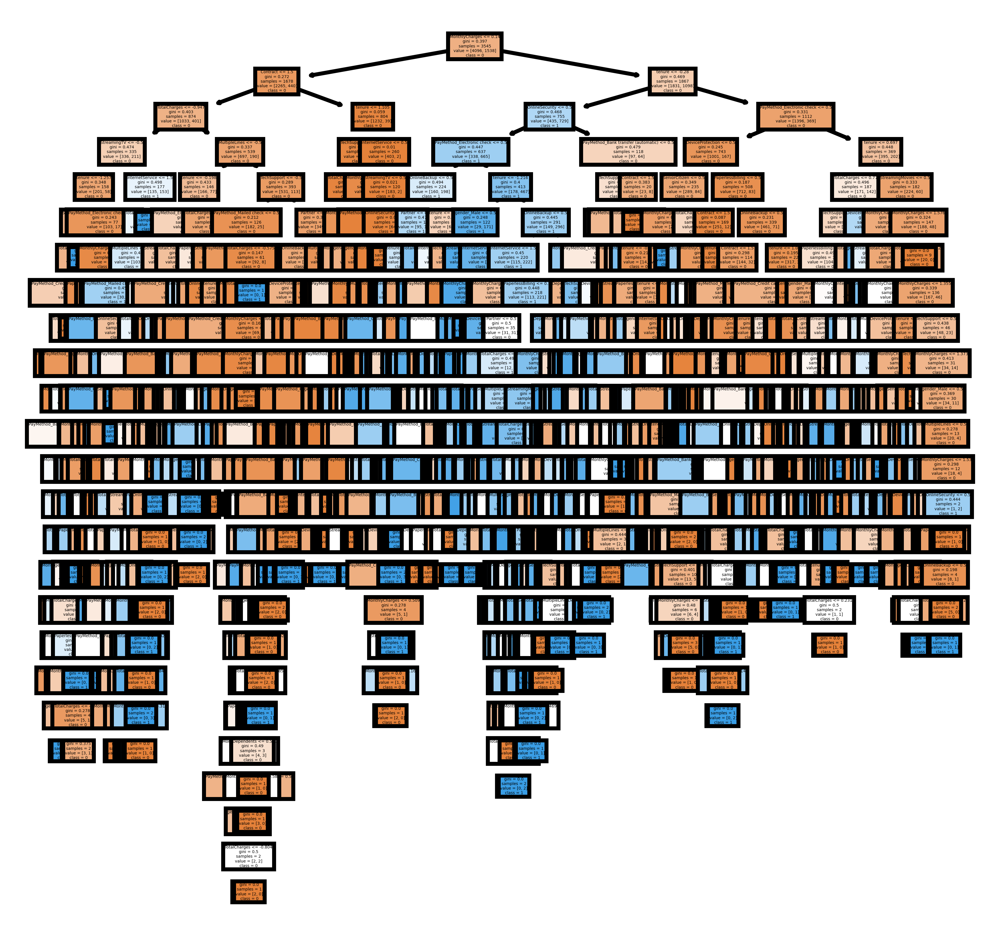

In [838]:
#Visualize the tree at 0th index for the Random Forest Classifier Model with default values  
visualize_tree(rfcModel)

* Very complex tree and also there is scope of improvement.
* Let us do GridSearchCV to find best hyperparameters for RandomForestClassifier

##### D. Use grid search and improve the performance of the Random tree model , check the performance of the model on train and test data , provide the differences observed in performance in Q3.c and Q3.d ( 5 marks )

In [844]:
param_grid = {
    'n_estimators': [50, 100, 150],  
    'max_depth': [None, 5, 10, 15],  
    'min_samples_split': [2, 5, 10], 
    'min_samples_leaf': [1, 2, 4],  
    'criterion': ['gini', 'entropy','log_loss'] 
}

rfc_GS = RandomForestClassifier() # RandomForestClassifier initialization for GridSearch
rfc_gscv = GridSearchCV(rfc_GS, param_grid, cv=3, scoring='recall') 
rfc_gscv.fit(X_train, Y_train)

print("Best Hyperparameters:", rfc_gscv.best_params_)

# Use the best model to make predictions
best_rfcModel_GSCV = rfc_gscv.best_estimator_

Best Hyperparameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 50}


================Performance Score================
Accuracy on training dataset :  0.8624423145189918
Accuracy on test dataset :  0.8055358410220014

Recall on training dataset :  0.6488294314381271
Recall on test dataset :  0.5106951871657754

Precision on training dataset :  0.7950819672131147
Precision on test dataset :  0.6773049645390071

F1-Score on training dataset :  0.7145488029465931
F1-Score on test dataset :  0.5823170731707317

================Classfication Report for test data=============
              precision    recall  f1-score   support

           0       0.84      0.91      0.87      1035
           1       0.68      0.51      0.58       374

    accuracy                           0.81      1409
   macro avg       0.76      0.71      0.73      1409
weighted avg       0.80      0.81      0.80      1409


================Confusion Matrix for test data=================


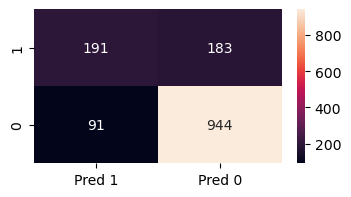

In [853]:
#Predit and print performance matrices for GridSearched Random Forest Classifier Model
predict_perfscore_confmatrix(best_rfcModel_GSCV,'RandomForestAfterGridSearchCV')

**Insights:**
* After doing GridSearch for RandomForestClassifier model, we found the best HyperParameters for this model considering best recall:  
* Best Hyperparameters: Best Hyperparameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 50}
* Considering this hyperparameters our performance score has improved after GridSearchCV and has reduced overfit.
* Performance score is now better compared to last default RandomForest classifier model.
* Accuracy on training 86.24% and test data 80.55%, which is good and is not an overfit. 
* Recall(64.8% on training, 51% on test), Precision(79.5% on training, 67.7% on test) and F1 score(71.4% on training, 58.2% on test) is better than previous RandomForest with default parameters.
* If we look at the classification report, precision 84%, recall 91%, f1-score 87% for Churn 0 is good. For Churn 1, precision 68%, recall 51%, f1-score 58% .They together make an avg of 76% for precision and 71% for recall and 73% for f1-score and an accuracy of 81%. 
* If we look at confusion matrix, True Positive is 191 and True Negative is 944. but False positive 91 and False Negative 183.
* Overall score of this RandomForestGridsSearched model is better. 

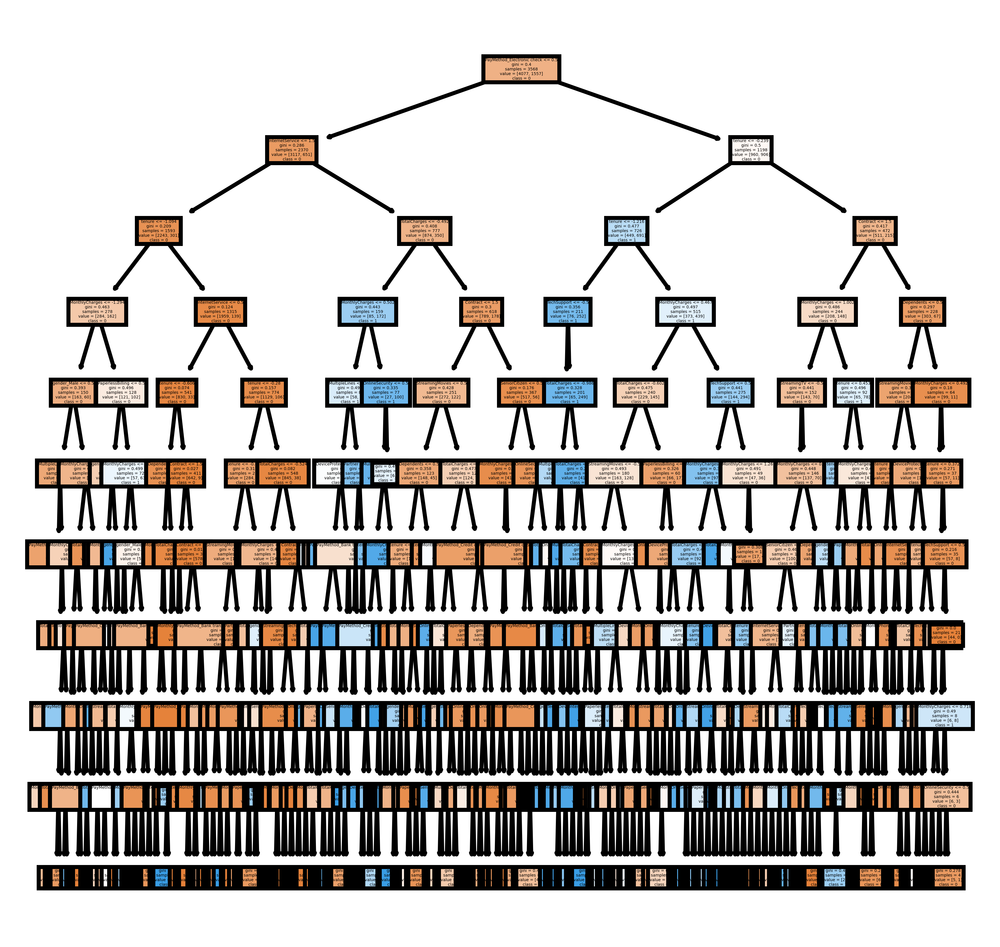

In [855]:
#Visualize the tree at 0th index for the model made after grid search on RandomForestClassifier 
visualize_tree(best_rfcModel_GSCV)

In [854]:
performance_summary_all

,Method,train_accuracy,train_recall,train_precision,train_f1,test_accuracy,test_recall,test_precision,test_f1
0,DecisionTree,0.997870,0.991973,1.000000,0.995970,0.735983,0.500000,0.502688,0.501340
1,DecisionTreeAfterRegularization,0.800142,0.584615,0.633793,0.608212,0.790632,0.561497,0.615836,0.587413
2,DecisionTreeAfterGridSearchCV,0.799610,0.585284,0.632225,0.607850,0.790632,0.564171,0.615160,0.588563
3,RandomForest,0.997693,0.995318,0.995984,0.995651,0.790632,0.475936,0.642599,0.546851
4,RandomForestAfterGridSearchCV,0.862442,0.648829,0.795082,0.714549,0.805536,0.510695,0.677305,0.582317


**Insights:**
* Comparing performance of RandomForest and RandomeForestAfterGridSearchCV, we can see the improvement in accuracy by 1% on test data and reduced overfit. we have got reduction in train_accuracy but increase in test_accuracy. which is sign of better than previous model.
* Same case with Recall, precision and f1-score, high training score but low testing score was causing overfit issue. 
* We have seen decrease in training score and increase in testing score, which has drastically reduced overfitting issue. 
* Hence, the last model RandomeForestAfterGridSearchCV is better with reduced overfittness and increase accuracy, recall, precision and f1-score on test data.

##### E. Train a model using Adaboost and check the performance of the model on train and test data ( 4 marks )

In [856]:
from sklearn.ensemble import AdaBoostClassifier

abcModel = AdaBoostClassifier(random_state=1) #build the model
abcModel = abcModel.fit(X_train, Y_train) #train the model

================Performance Score================
Accuracy on training dataset :  0.8109691160809371
Accuracy on test dataset :  0.7998580553584103

Recall on training dataset :  0.5498327759197325
Recall on test dataset :  0.516042780748663

Precision on training dataset :  0.6771004942339374
Precision on test dataset :  0.6564625850340136

F1-Score on training dataset :  0.6068660022148393
F1-Score on test dataset :  0.5778443113772453

================Classfication Report for test data=============
              precision    recall  f1-score   support

           0       0.84      0.90      0.87      1035
           1       0.66      0.52      0.58       374

    accuracy                           0.80      1409
   macro avg       0.75      0.71      0.72      1409
weighted avg       0.79      0.80      0.79      1409


================Confusion Matrix for test data=================


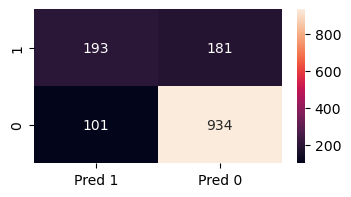

In [857]:
#Predit and print performance matrices for AdaBoost Classifier Model
predict_perfscore_confmatrix(abcModel, 'AdaBoost')

**Insights:**
* Accuracy on training data is 81% which is ok and accuracy of test data is 79.98% which is good and is no overfit.
* Recall(54.98%), Precision(67.7%) and F1-score(60.6%) on training data which is not very good and on test data recall(51.6%), precision(65.6%) and f1-score(57.7%) which is good compared to the training score but if we see the individual perforamnce score, these scores are not up to the mark to consider it a good model. 
* We need to work on this further by tuning hyperparameter to improve the perofrmance, we will try GridSearchCV.
* If we look at the classification report, precision 84%, recall 97%, f1-score 87% for Churn 0 is good. but for Churn 1, precision 66%, recall 52%, f1-score 58% which is very low. which together makes an avg of 75%, 71% and 72% respectively for precision, recall and f1-score and an accuracy of 80%. 
* If we look at confusion matrix, 
    * True Positive is 193 and True Negative is 934. 
    * False positive 101 and False Negative 181 which should be reduced. 

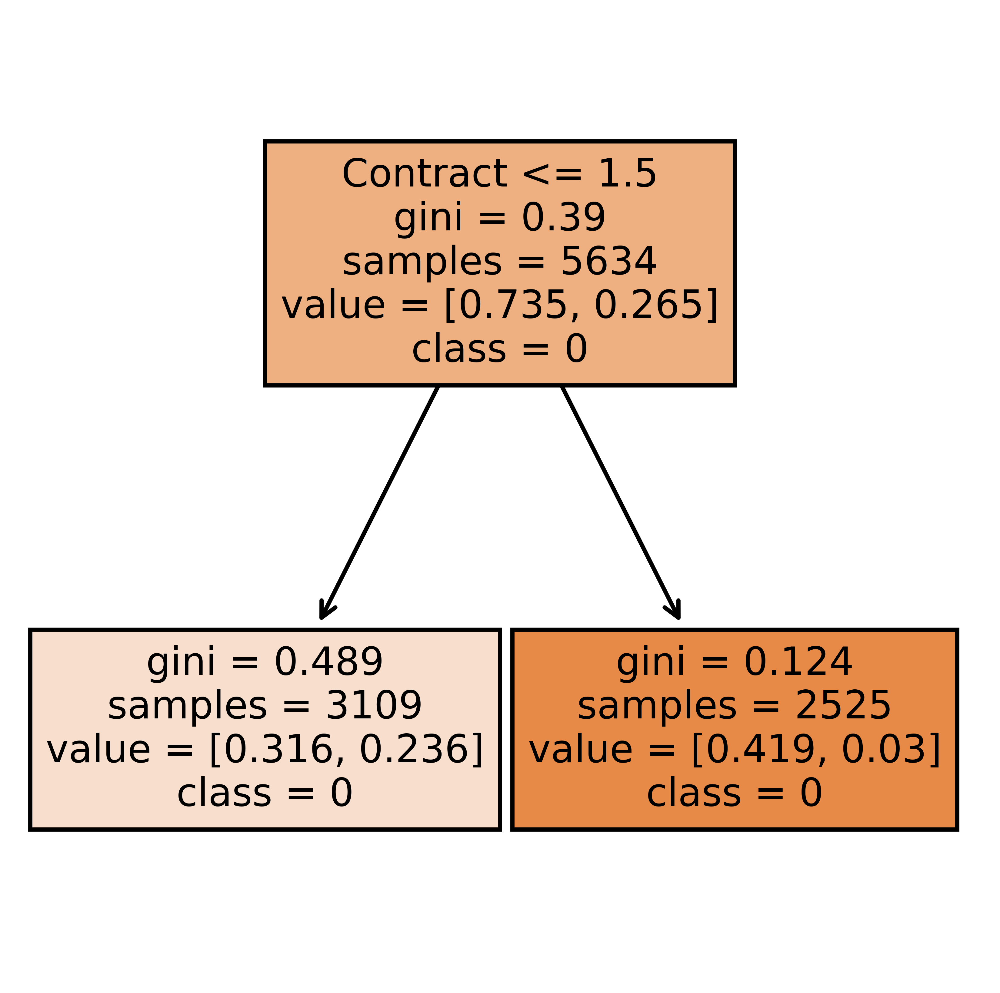

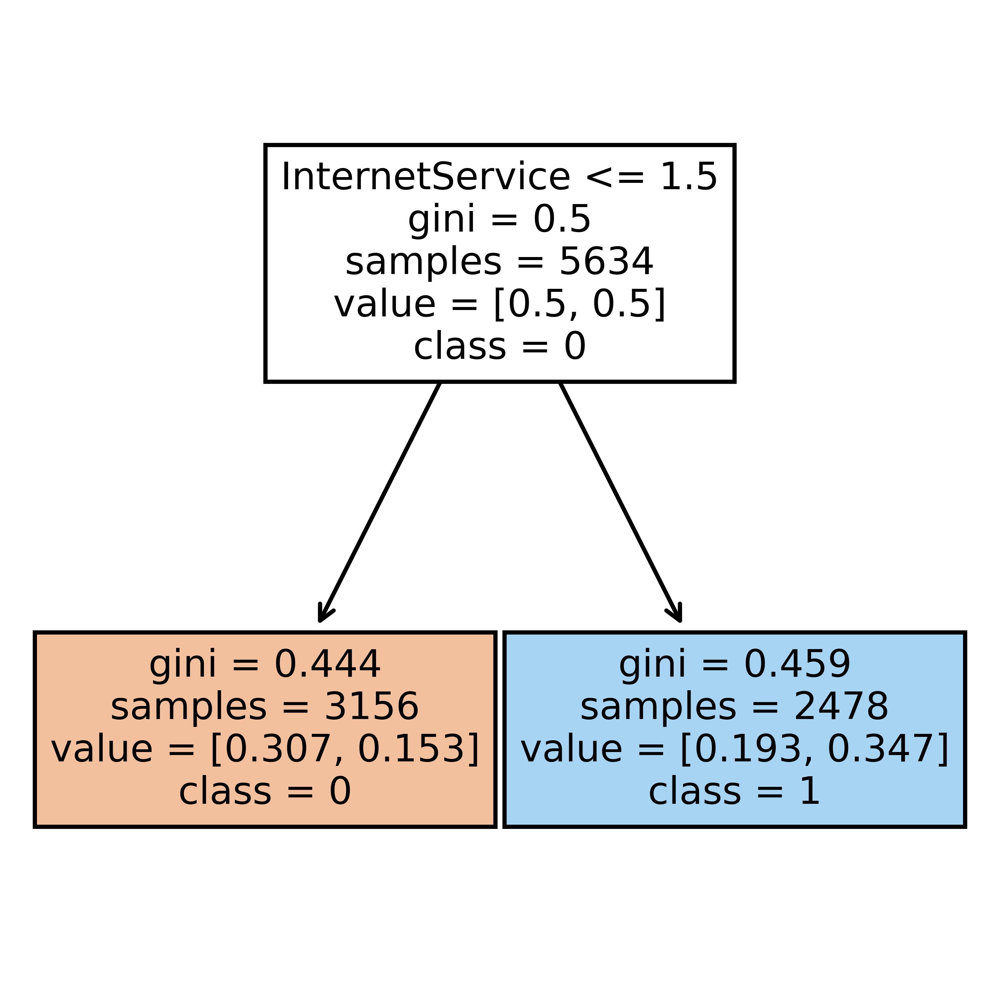

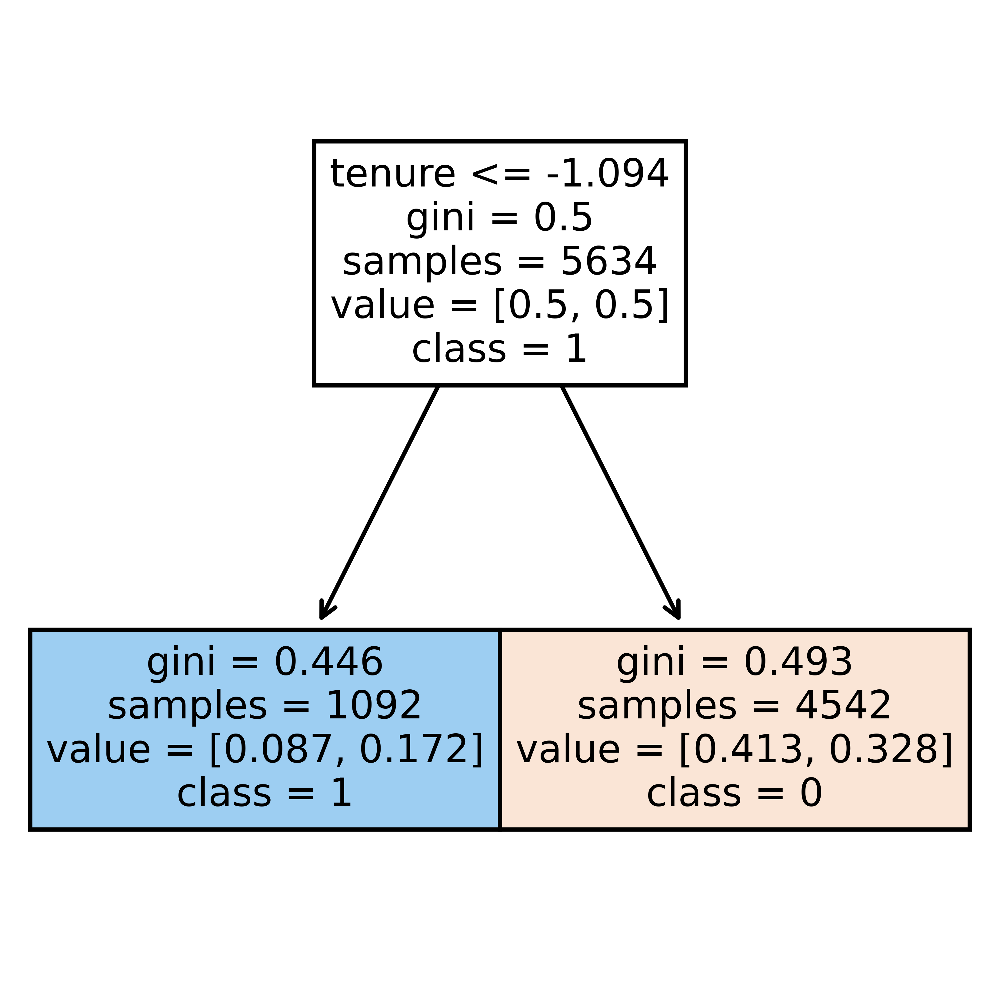

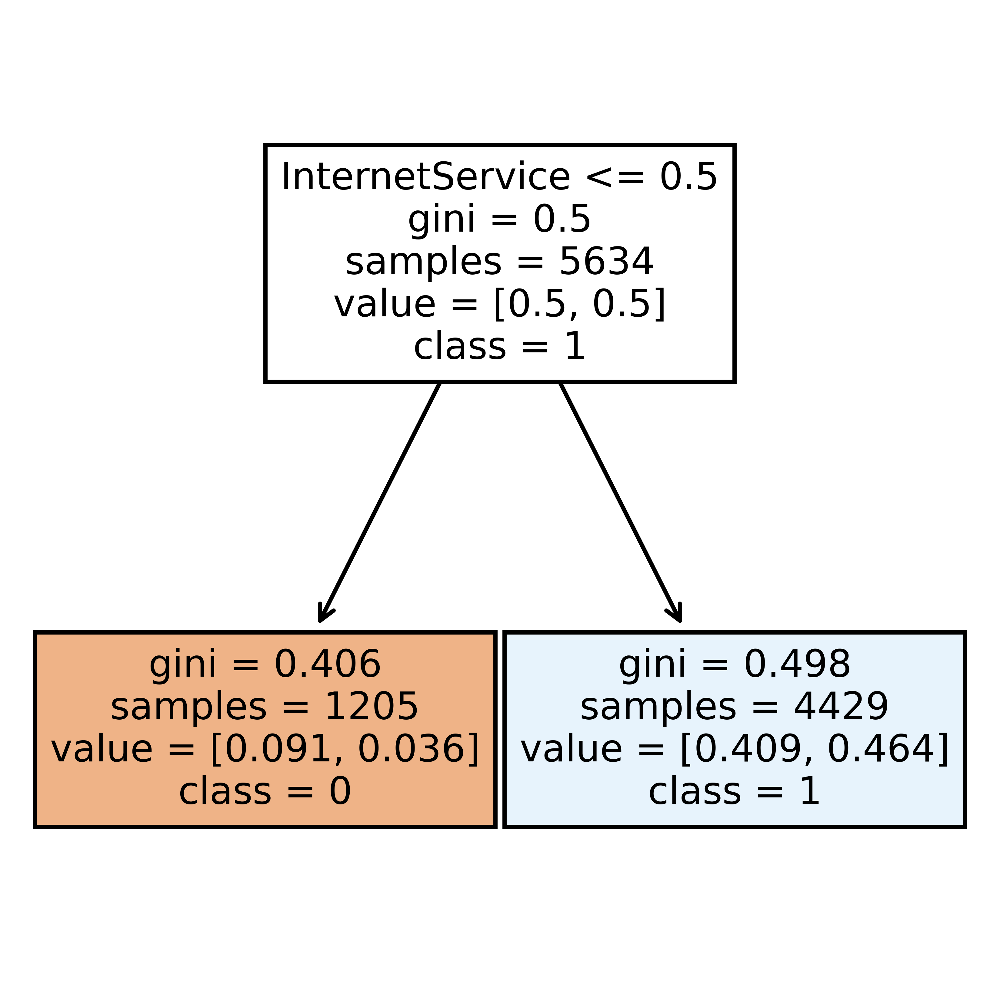

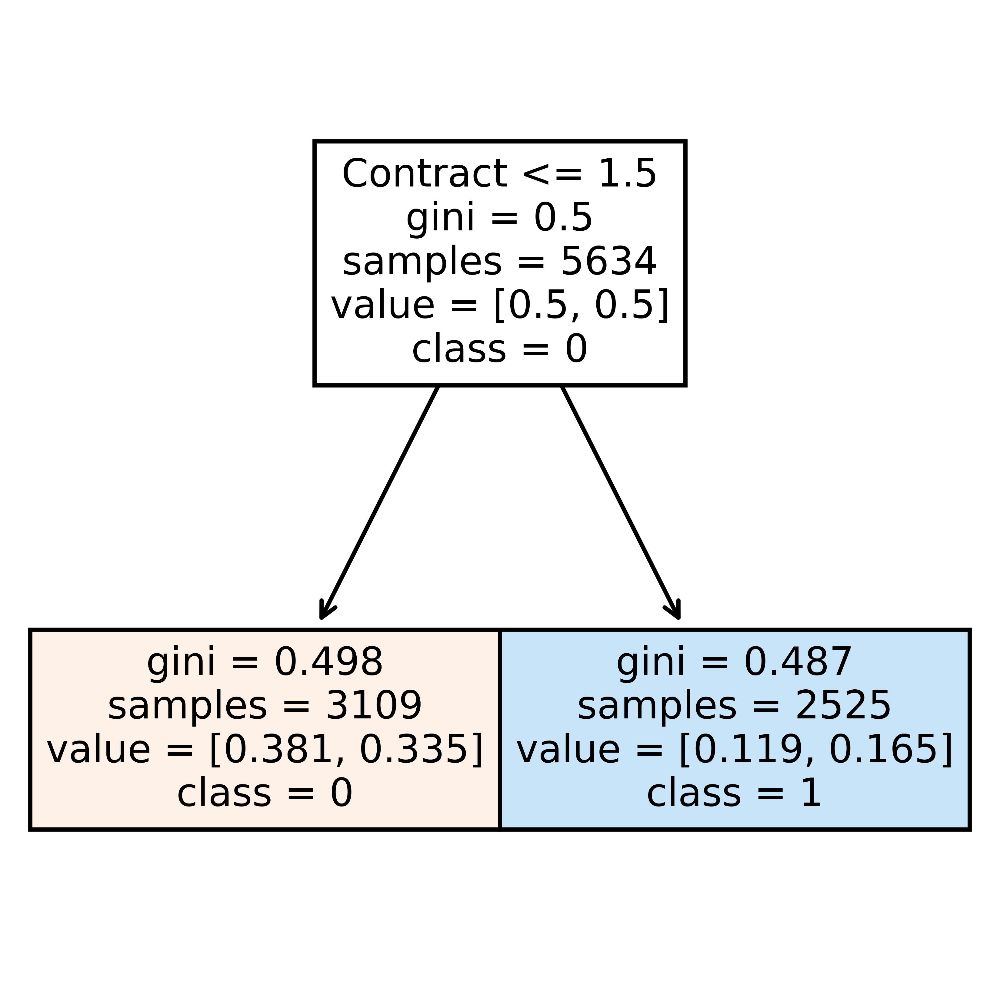

In [864]:
#Visualize some of the trees at few indexes for AdaBoostClassifier model
for i in range(0,5):
    visualize_tree(abcModel,i)

##### F. Use grid search and improve the performance of the Adaboost model , check the performance of the model on train and test data , provide the differences observed in performance in Q3.e and Q3.f ( 5 marks )

In [872]:
estimator = [DecisionTreeClassifier(max_depth=1, random_state=1),
             DecisionTreeClassifier(max_depth=2, random_state=1),
             DecisionTreeClassifier(max_depth=3, random_state=1)]

param_grid = {
    'estimator': estimator,
    "n_estimators": np.arange(10,110,10),
    "learning_rate":np.arange(0.1,2,0.1)
}

abc_GS = AdaBoostClassifier(random_state=1) # AdaBoostClassifier initialization for GridSearch

abc_gscv = GridSearchCV(abc_GS, param_grid, cv=5, scoring='recall') 
abc_gscv.fit(X_train, Y_train)

print("Best Hyperparameters:", abc_gscv.best_params_)

# Use the best model to make predictions
best_abcModel_GSCV = abc_gscv.best_estimator_

Best Hyperparameters: {'estimator': DecisionTreeClassifier(max_depth=1, random_state=1), 'learning_rate': 1.4000000000000001, 'n_estimators': 10}


================Performance Score================
Accuracy on training dataset :  0.7841675541356052
Accuracy on test dataset :  0.7799858055358411

Recall on training dataset :  0.6
Recall on test dataset :  0.5748663101604278

Precision on training dataset :  0.592079207920792
Precision on test dataset :  0.587431693989071

F1-Score on training dataset :  0.5960132890365448
F1-Score on test dataset :  0.581081081081081

================Classfication Report for test data=============
              precision    recall  f1-score   support

           0       0.85      0.85      0.85      1035
           1       0.59      0.57      0.58       374

    accuracy                           0.78      1409
   macro avg       0.72      0.71      0.72      1409
weighted avg       0.78      0.78      0.78      1409


================Confusion Matrix for test data=================


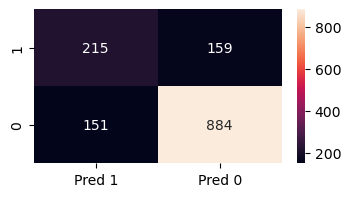

In [873]:
#Predit and print performance matrices for GridSearched AdaBoostClassifier Model
predict_perfscore_confmatrix(best_abcModel_GSCV,'AdaBoostAfterGridSearchCV')

**Insights:**
* Accuracy on training and test data is almost same. Hence it is not an overfit.
* Recall, Precision and F1-Score on training and test data is also almost same, so it is also not an overfit.
* But from performance score point of view, it is not a good score to have around 58% for Recall, Precision and F1-score on test data. 
* Accuracy of 78% is ok. but not that good.
* If we look at the classification report, precision 85%, recall 85%, f1-score 85% for Churn 0 is good. but for Churn 1, precision 59%, recall 57%, f1-score 58%. They together make an avg of 72% for precision and 71% for recall and 72% for f1-score and an accuracy of 78%. 
* If we look at confusion matrix, True Positive is 215 and True Negative is 884. but False positive 151 and False Negative 159.

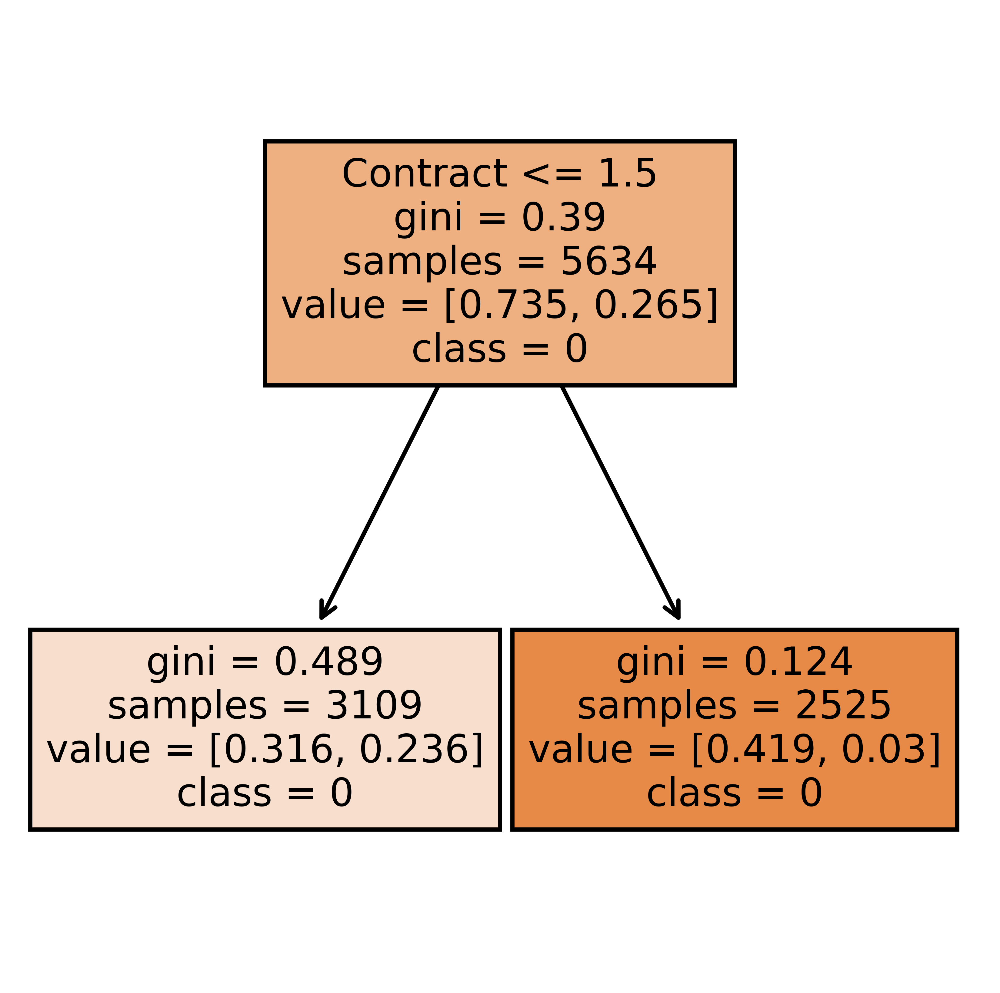

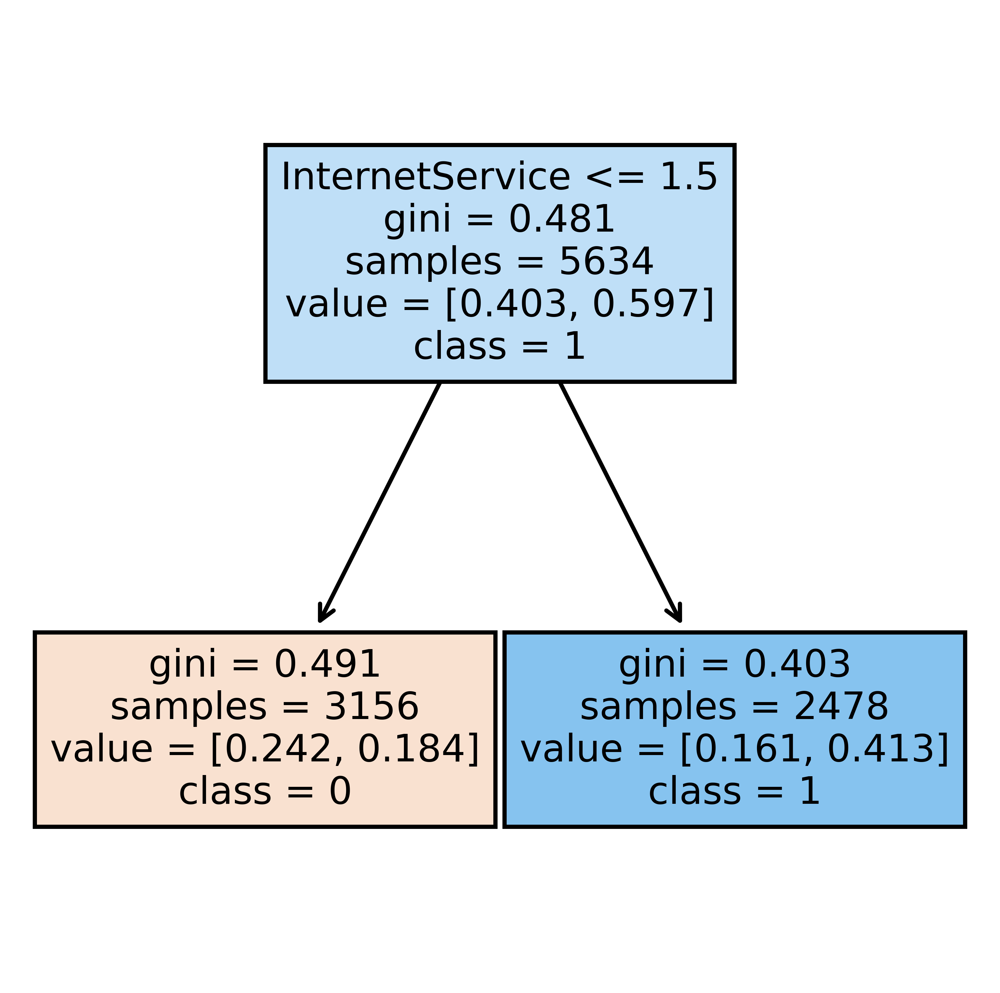

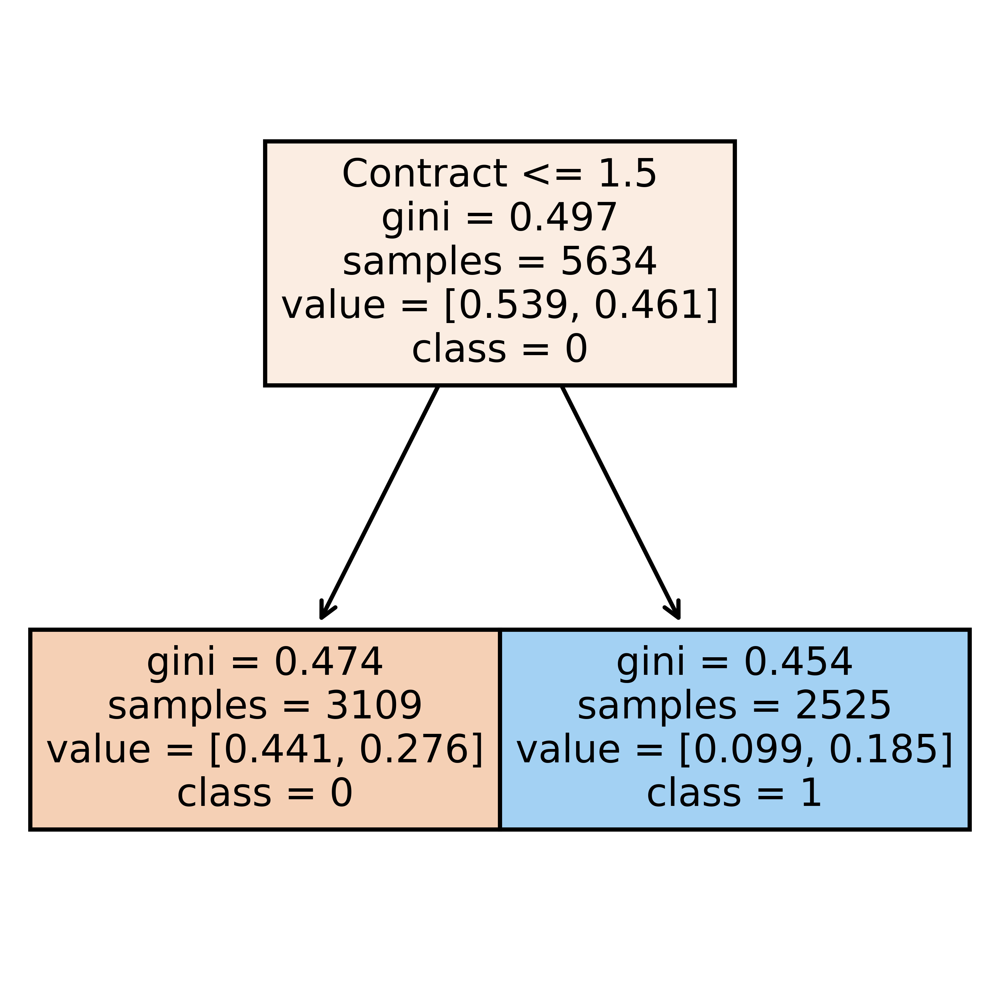

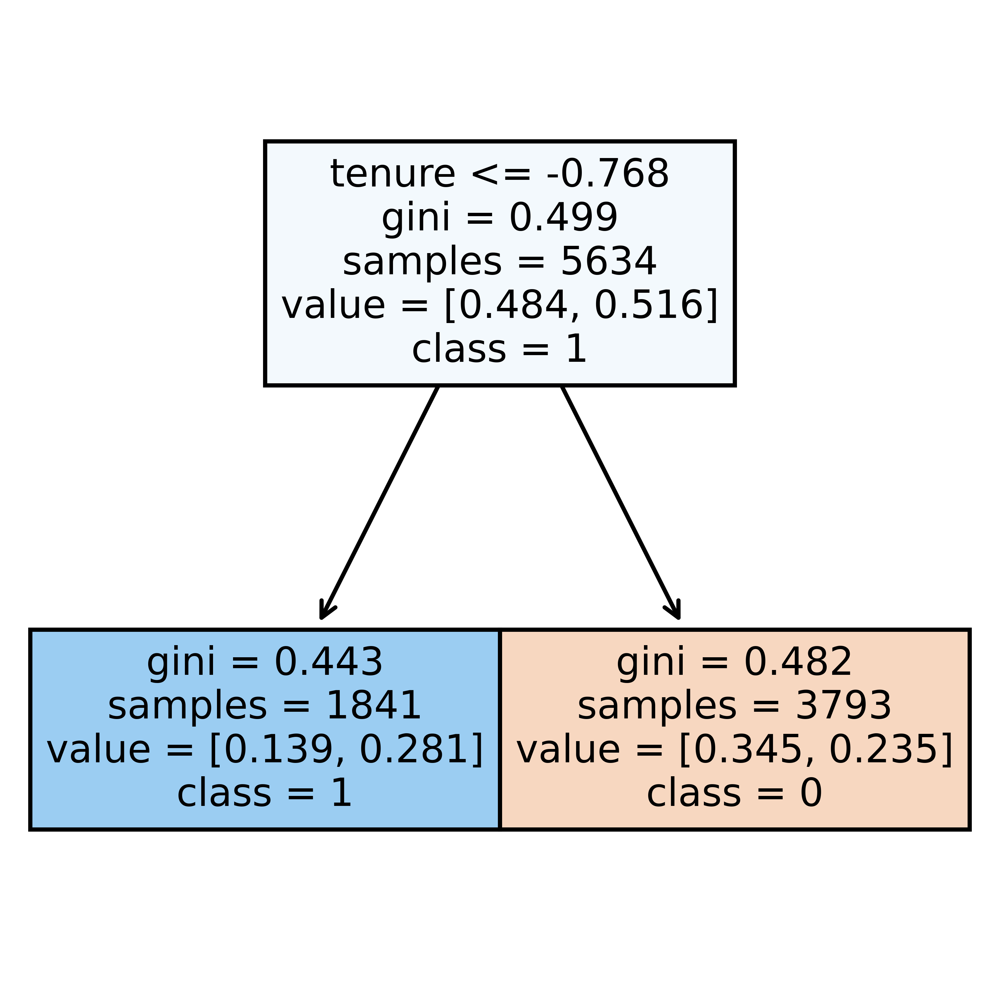

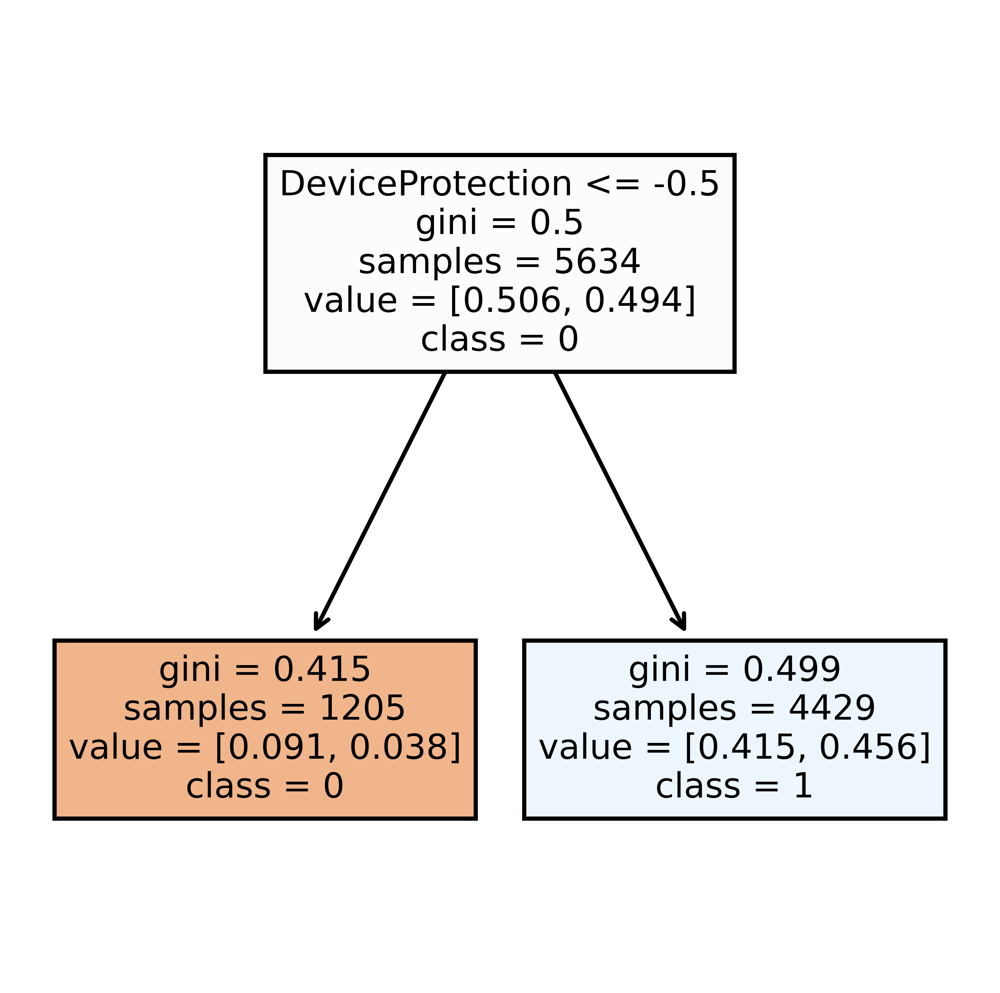

In [874]:
#Visualize some of the trees at few indexes for AdaBoostClassifier model found best by GridSearch
for i in range(0,5):
    visualize_tree(best_abcModel_GSCV,i)

In [875]:
performance_summary_all

,Method,train_accuracy,train_recall,train_precision,train_f1,test_accuracy,test_recall,test_precision,test_f1
0,DecisionTree,0.997870,0.991973,1.000000,0.995970,0.735983,0.500000,0.502688,0.501340
1,DecisionTreeAfterRegularization,0.800142,0.584615,0.633793,0.608212,0.790632,0.561497,0.615836,0.587413
2,DecisionTreeAfterGridSearchCV,0.799610,0.585284,0.632225,0.607850,0.790632,0.564171,0.615160,0.588563
3,RandomForest,0.997693,0.995318,0.995984,0.995651,0.790632,0.475936,0.642599,0.546851
4,RandomForestAfterGridSearchCV,0.862442,0.648829,0.795082,0.714549,0.805536,0.510695,0.677305,0.582317
5,AdaBoost,0.810969,0.549833,0.677100,0.606866,0.799858,0.516043,0.656463,0.577844
6,AdaBoostAfterGridSearchCV,0.784168,0.600000,0.592079,0.596013,0.779986,0.574866,0.587432,0.581081


**Insights:**
* if we compare AdaBoost with default parameters and best model by gridsearch AdaBoostAfterGridSearchCV:
* train_accuracy for AdaBoost is 81% but for AdaBoostAfterGridSearchCV is just 78.4% which is lower. 
* test_accuracy for AdaBoost is 79.9% but for AdaBoostAfterGridSearchCV is 77.7% which is also lower. So from Accuracy point of view AdaBoost is better than AdaBoostGridSearchCV.

* train_recall for AdaBoost is 54.98% but for AdaBoostAfterGridSearchCV is just 60% which is higher. 
* test_recall for AdaBoost is 51.6% but for AdaBoostAfterGridSearchCV is 57.48% which is higher. So from Recall point of view AdaBoostGridSearchCV is better than AdaBoost.

* train_precision for AdaBoost is 67.7% but for AdaBoostAfterGridSearchCV is just 59.2% which is lower. 
* test_precision for AdaBoost is 65.6% but for AdaBoostAfterGridSearchCV is 58.7% which is lower. So from Precision point of view AdaBoost is better than AdaBoostGridSearchCV.

* train_f1 for AdaBoost is 60.6% but for AdaBoostAfterGridSearchCV is just 59.6% which is lower. 
* test_f1 for AdaBoost is 57.7% but for AdaBoostAfterGridSearchCV is 58.1% which is higher. So from F1-score point of view AdaBoostGridSearchCV is better than AdaBoost.

##### G. Train a model using GradientBoost and check the performance of the model on train and test data ( 4 marks )

In [876]:
from sklearn.ensemble import GradientBoostingClassifier

# Let us try AdaBoost classifier as the estimator for initial predictions in GradientBoostingClassifier
gbcModel = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1), random_state=1) #build the model
gbcModel.fit(X_train, Y_train) #train the model

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           random_state=1)

================Performance Score================
Accuracy on training dataset :  0.8274760383386581
Accuracy on test dataset :  0.7998580553584103

Recall on training dataset :  0.5719063545150501
Recall on test dataset :  0.5

Precision on training dataset :  0.7203032855939343
Precision on test dataset :  0.6631205673758865

F1-Score on training dataset :  0.6375838926174496
F1-Score on test dataset :  0.5701219512195123

================Classfication Report for test data=============
              precision    recall  f1-score   support

           0       0.83      0.91      0.87      1035
           1       0.66      0.50      0.57       374

    accuracy                           0.80      1409
   macro avg       0.75      0.70      0.72      1409
weighted avg       0.79      0.80      0.79      1409


================Confusion Matrix for test data=================


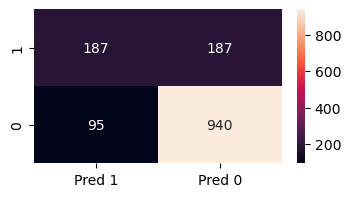

In [877]:
#Predit and print performance matrices for GradientBoost Classifier Model
predict_perfscore_confmatrix(gbcModel, 'GradientBoost')

**Insights:**
* Accuracy on training data is 82.7% which is ok and accuracy of test data is 79.9% which is good and is no overfit.
* Recall(54.1%), Precision(72%) and F1-score(63.7%) on training data which is not very good and on test data recall(50%), precision(66.3%) and f1-score(57%) which is good compared to the training score but if we see the individual perforamnce score, these scores are not up to the mark to consider it a good model.There is scope of improvement.  
* We need to work on this further by tuning hyperparameter to improve the perofrmance, we will try GridSearchCV.
* If we look at the classification report, precision 83%, recall 91%, f1-score 87% for Churn 0 is good. but for Churn 1, precision 66%, recall 50%, f1-score 57% which is very low. which together makes an avg of 75%, 70% and 72% respectively for precision, recall and f1-score and an accuracy of 80%. 
* If we look at confusion matrix, 
    * True Positive is 187 and True Negative is 940. 
    * False positive 95 and False Negative 187 which should be reduced. 

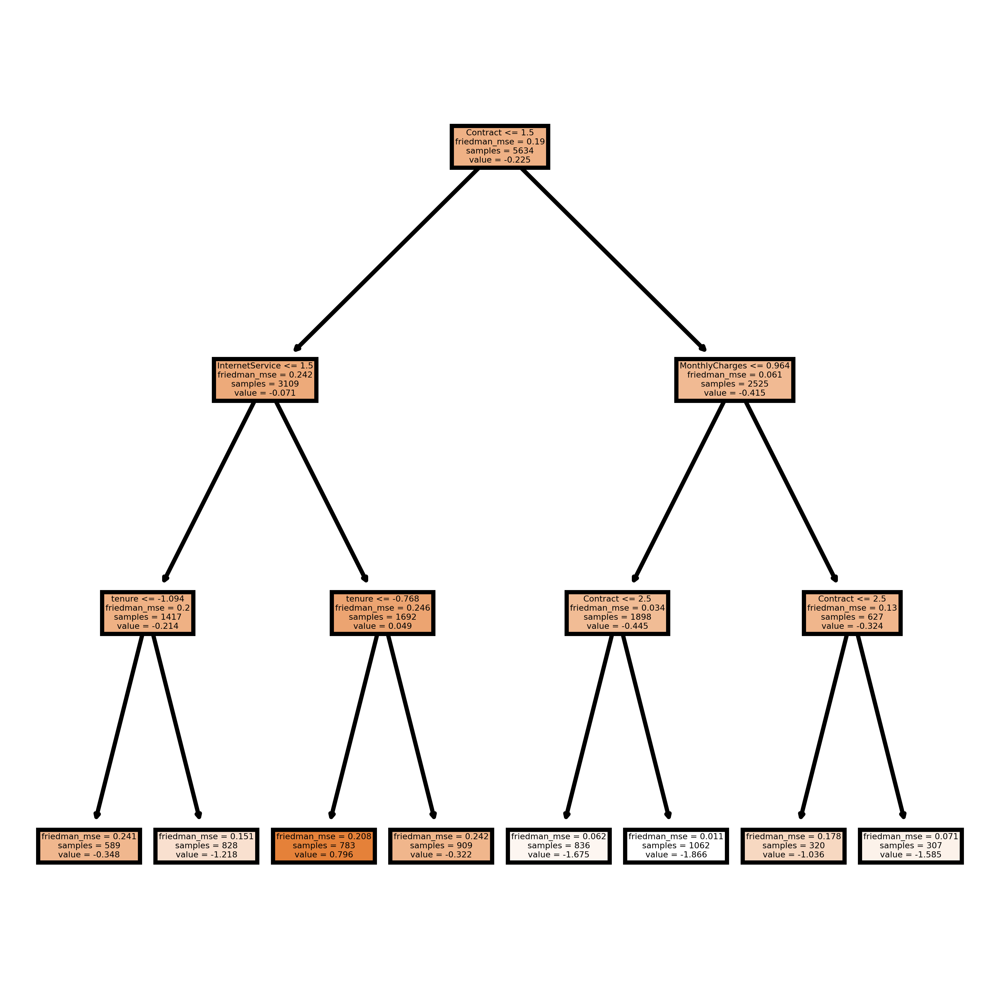

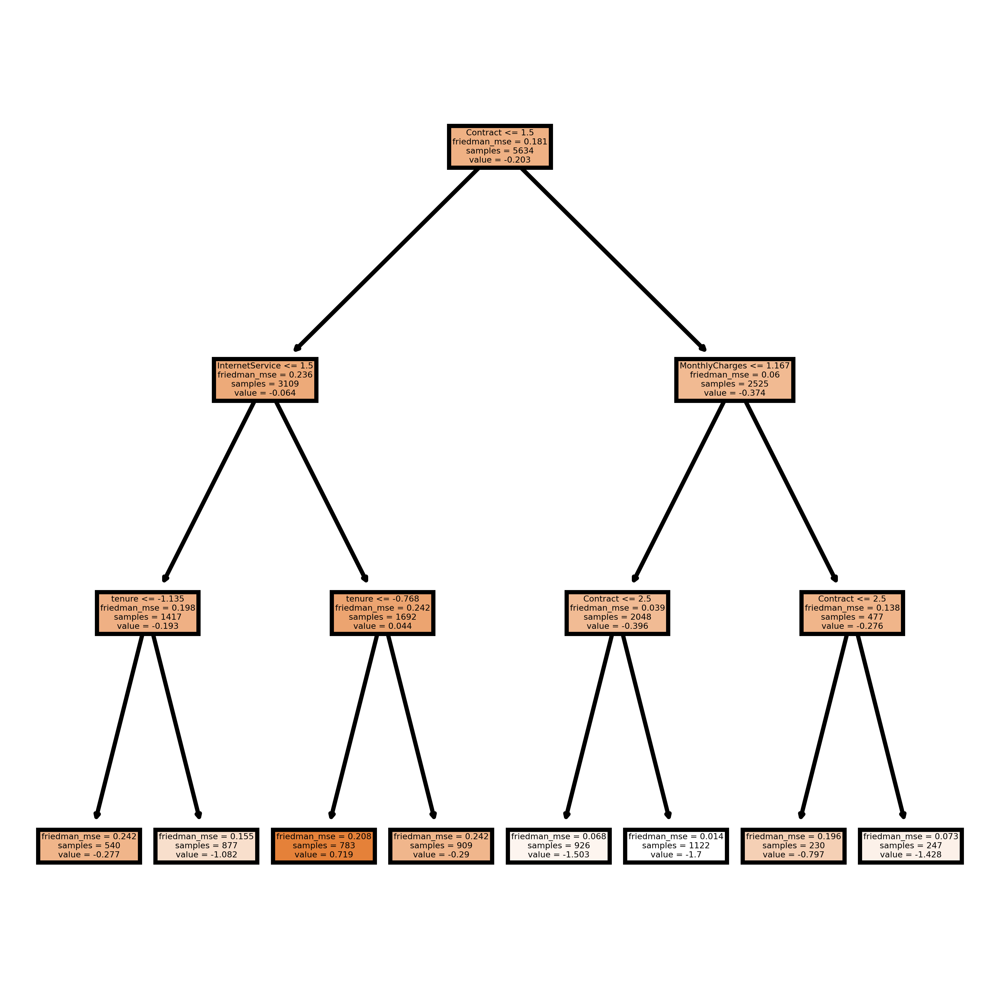

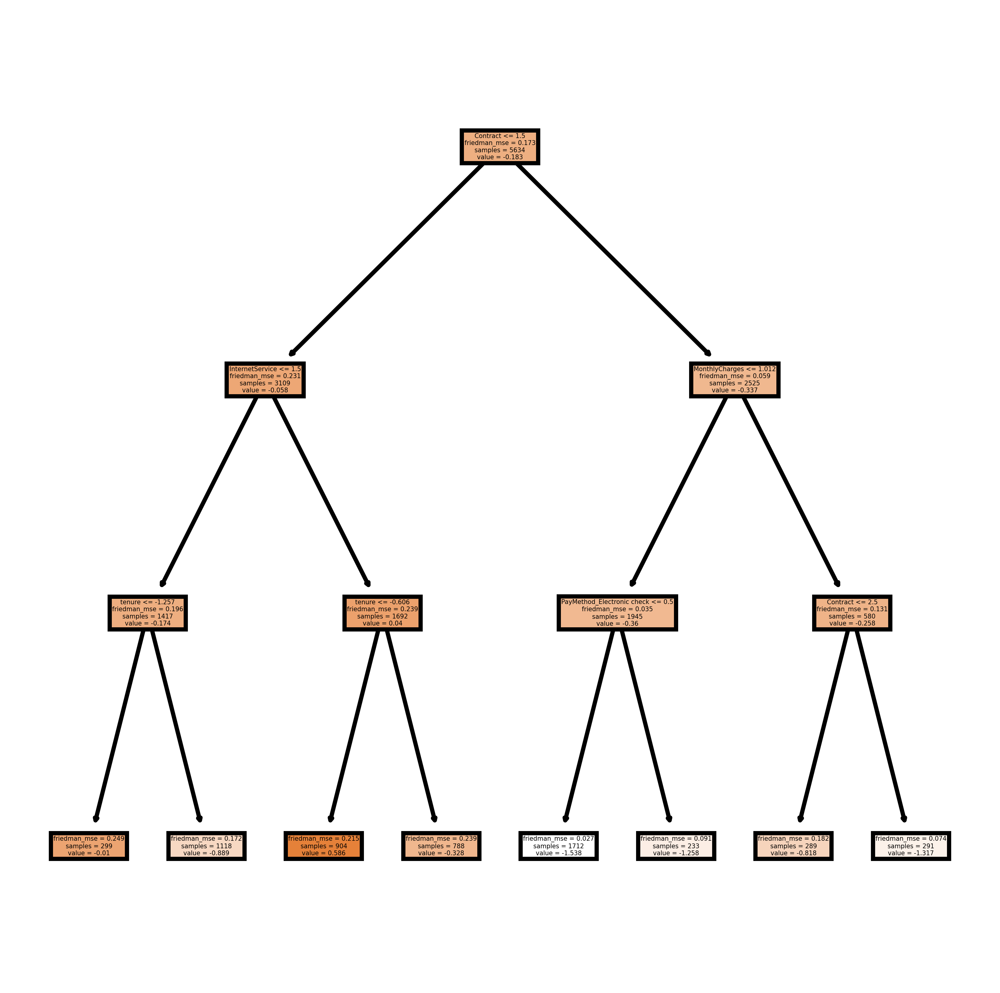

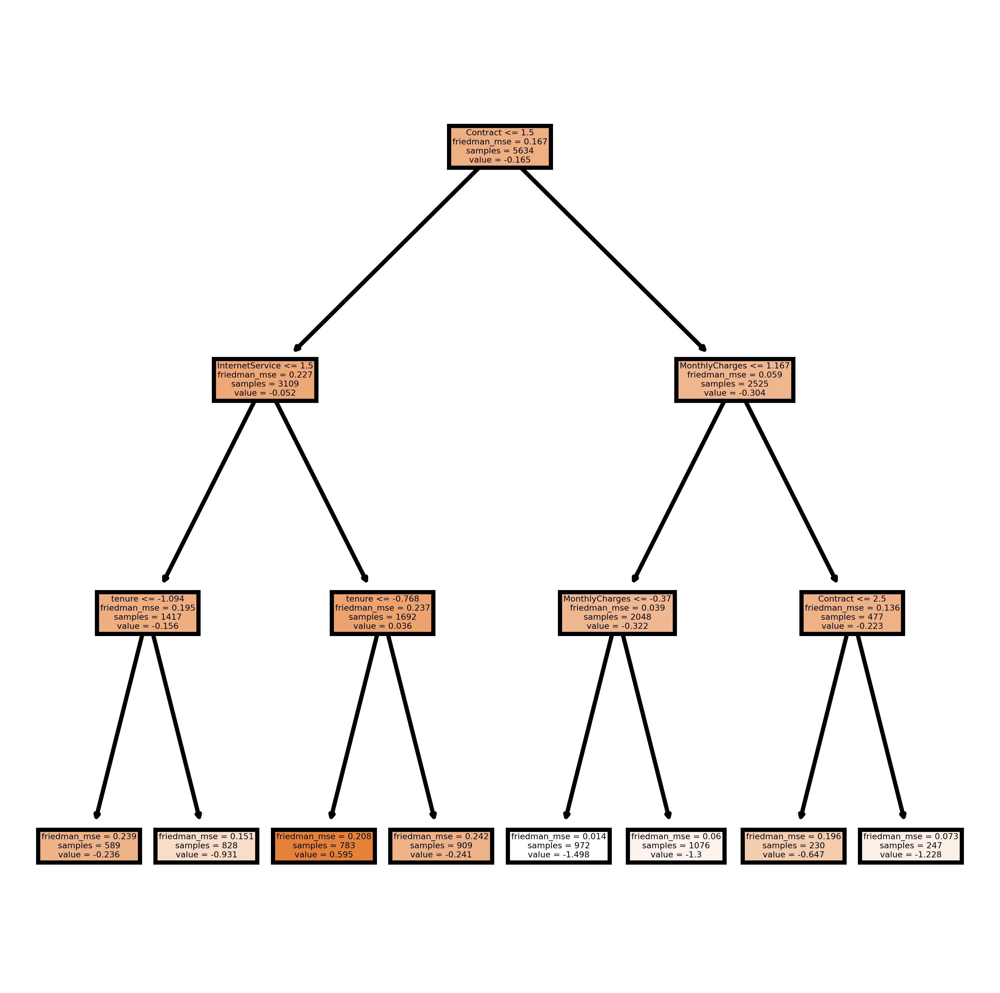

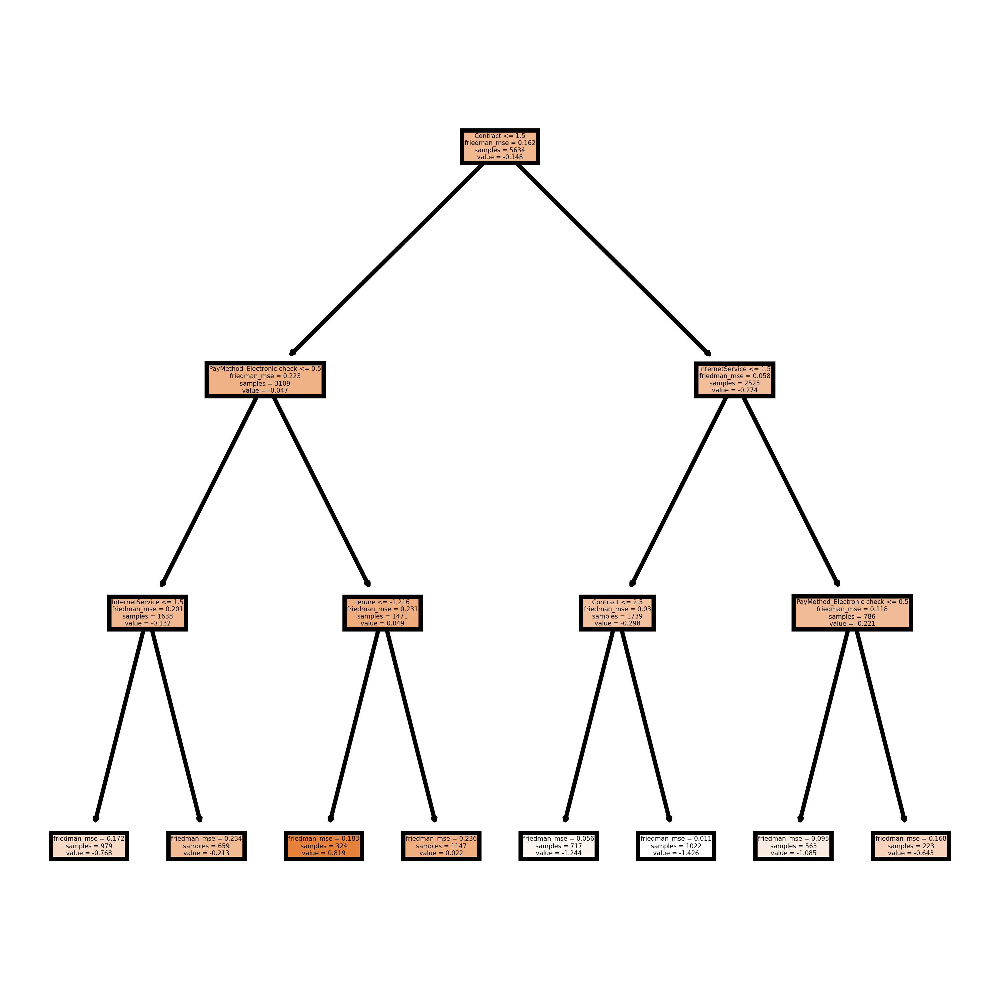

In [885]:
#Visualize some of the trees at few indexes and at first column for GradientBoostClassifier model
for i in range(0,5):
    for j in range(0,1):
        visualize_tree(gbcModel,i,j)

##### H. Use grid search and improve the performance of the GradientBoost model , check the performance of the model on train and test data , provide the differences observed in performance in Q3.g and Q3.h ( 5 marks )

In [887]:
param_grid = {   
    "n_estimators": [100,150,200,250],
    "subsample":[0.8,0.9,1],
    "max_features":[0.7,0.8,0.9,1]
}
gbc_GS = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1), random_state=1) # GradientBoostingClassifier initialization for GridSearch
gbc_gscv = GridSearchCV(gbc_GS, param_grid, cv=3, scoring='recall')

gbc_gscv.fit(X_train, Y_train)

print("Best Hyperparameters:", gbc_gscv.best_params_)

# Use the best model to make predictions
best_gbcModel_GSCV = gbc_gscv.best_estimator_

Best Hyperparameters: {'max_features': 1, 'n_estimators': 200, 'subsample': 1}


================Performance Score================
Accuracy on training dataset :  0.8178913738019169
Accuracy on test dataset :  0.8069552874378992

Recall on training dataset :  0.5612040133779265
Recall on test dataset :  0.5267379679144385

Precision on training dataset :  0.6939619520264682
Precision on test dataset :  0.6746575342465754

F1-Score on training dataset :  0.6205621301775148
F1-Score on test dataset :  0.5915915915915916

================Classfication Report for test data=============
              precision    recall  f1-score   support

           0       0.84      0.91      0.87      1035
           1       0.67      0.53      0.59       374

    accuracy                           0.81      1409
   macro avg       0.76      0.72      0.73      1409
weighted avg       0.80      0.81      0.80      1409


================Confusion Matrix for test data=================


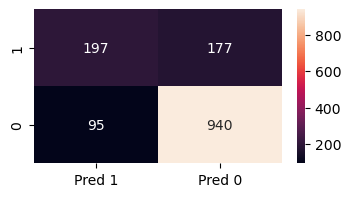

In [888]:
#Predit and print performance matrices for GridSearched GradientBoostingClassifier Model
predict_perfscore_confmatrix(best_gbcModel_GSCV,'GradientBoostAfterGridSearchCV')

**Insights:**
* Accuracy on training(81.7%) and test(80.6%) data is almost same. Hence it is not an overfit.
* Recall(56%), Precision(69.3%), F1-score(62%) on training data and Recall(52.6%), Precision(67.4%), F1-score(59.1%) on test data is not an overfit as there is not much difference in training and test data performance.
* If we look at the classification report, precision 84%, recall 91%, f1-score 87% for Churn 0 is good. but for Churn 1, precision 67%, recall 53%, f1-score 59%. They together make an avg of 76% for precision, 72% for recall and 73% for f1-score and an accuracy of 81%. 
* If we look at confusion matrix, True Positive is 197 and True Negative is 940. but False positive 95 and False Negative 177.

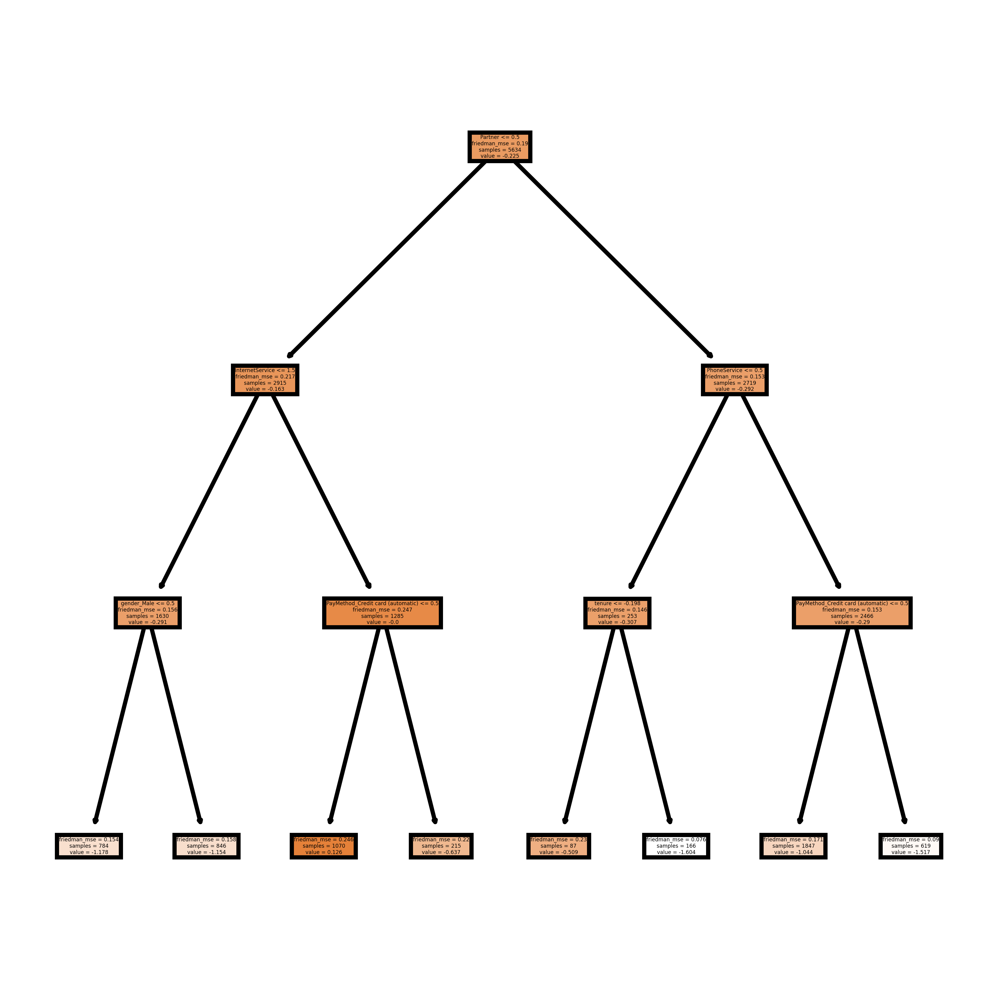

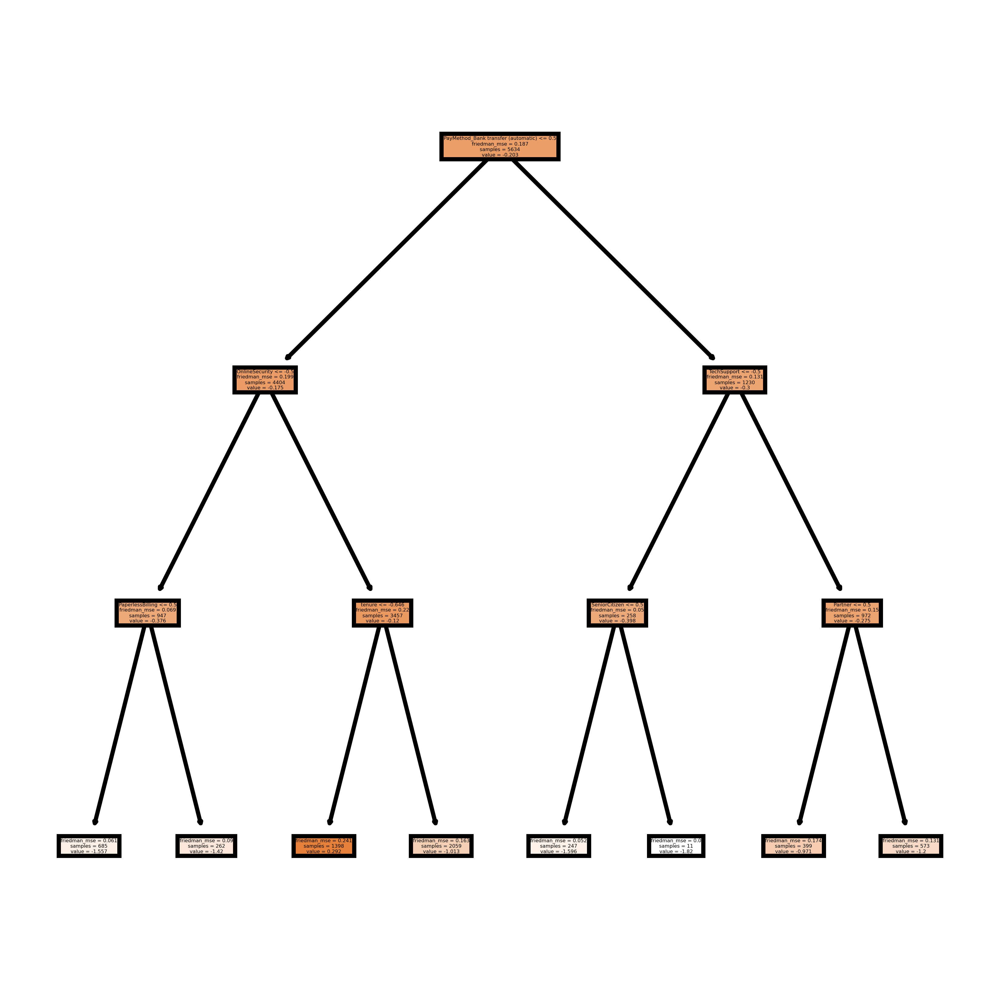

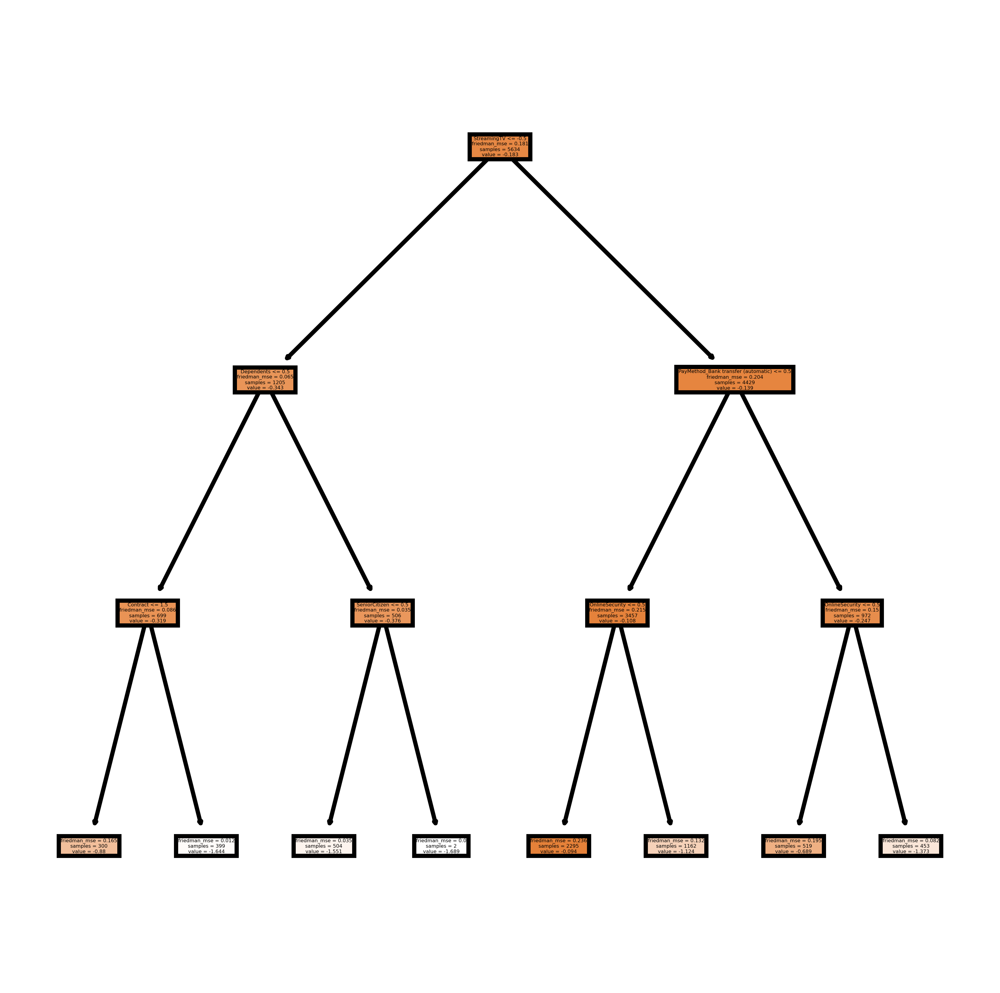

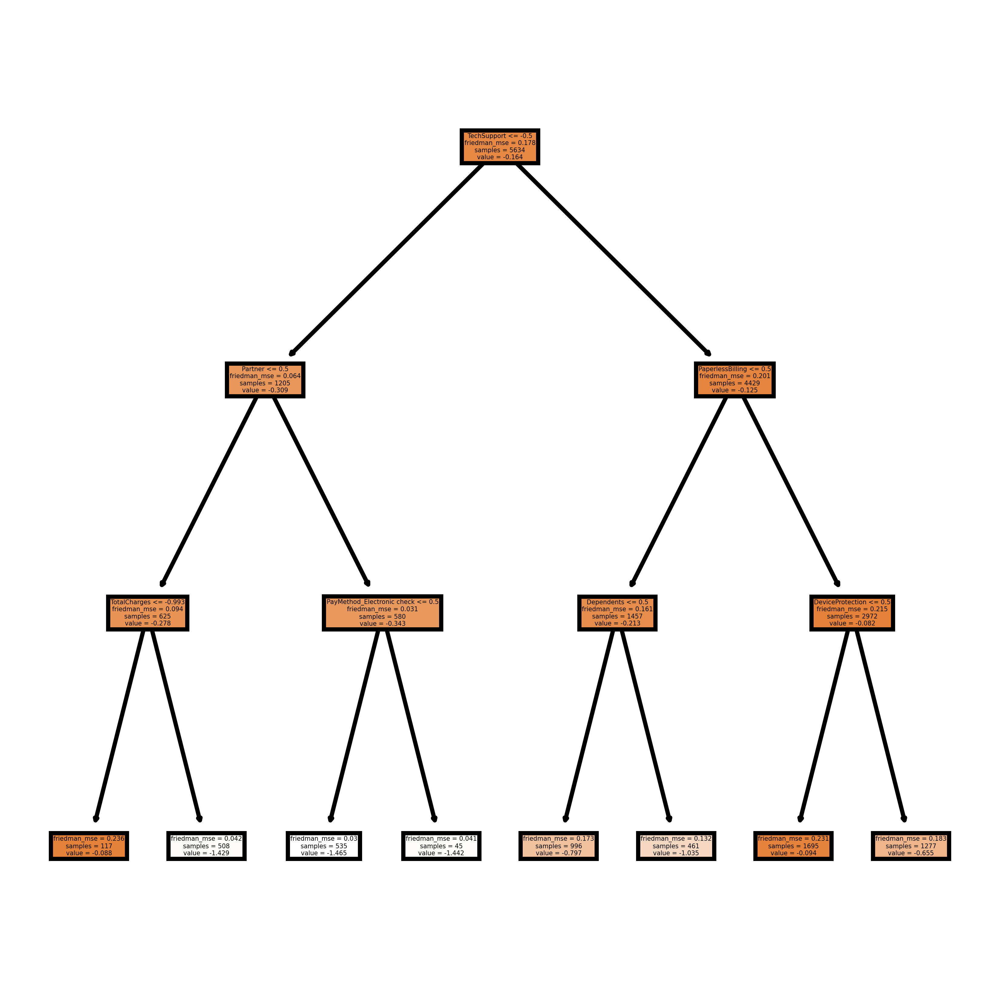

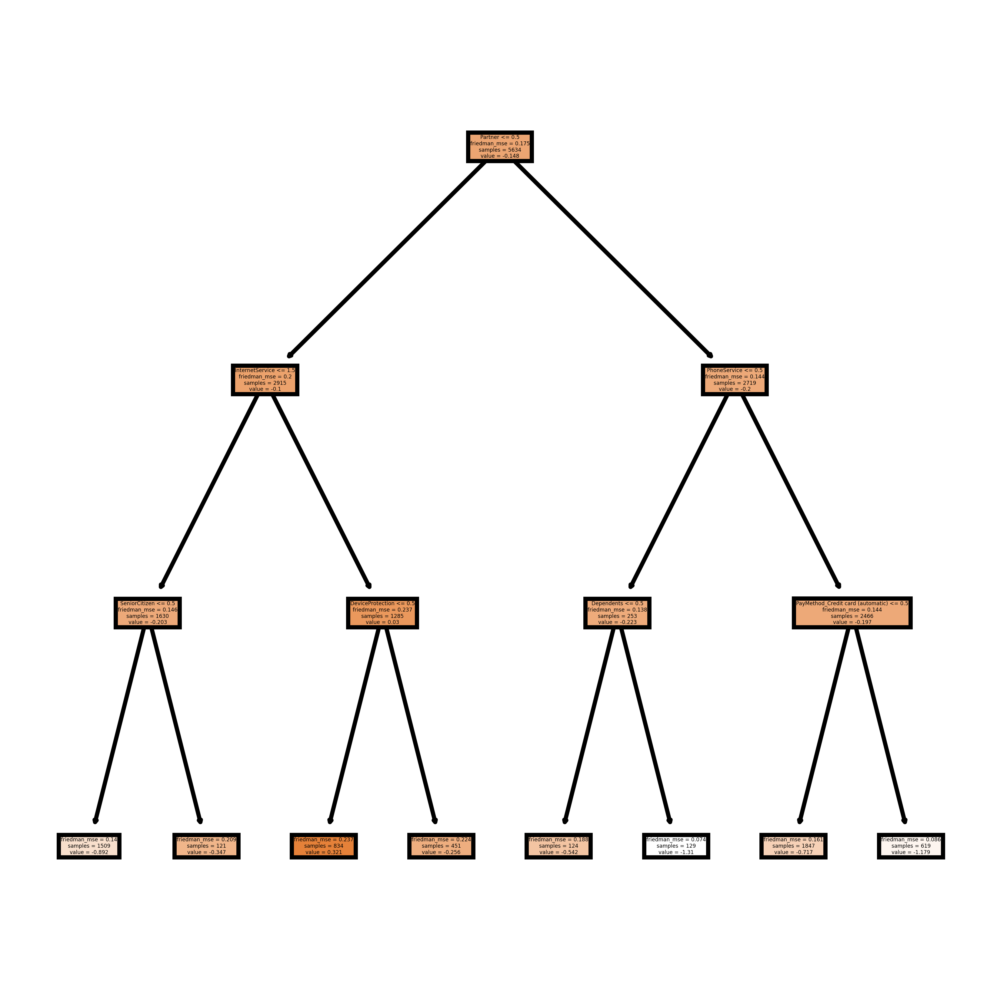

In [889]:
#Visualize some of the trees at few indexes and at first column for GradientBoostClassifier model found best after GridSearchCV
for i in range(0,5):
    for j in range(0,1):
        visualize_tree(best_gbcModel_GSCV,i,j)

In [891]:
performance_summary_all

,Method,train_accuracy,train_recall,train_precision,train_f1,test_accuracy,test_recall,test_precision,test_f1
0,DecisionTree,0.997870,0.991973,1.000000,0.995970,0.735983,0.500000,0.502688,0.501340
1,DecisionTreeAfterRegularization,0.800142,0.584615,0.633793,0.608212,0.790632,0.561497,0.615836,0.587413
2,DecisionTreeAfterGridSearchCV,0.799610,0.585284,0.632225,0.607850,0.790632,0.564171,0.615160,0.588563
3,RandomForest,0.997693,0.995318,0.995984,0.995651,0.790632,0.475936,0.642599,0.546851
4,RandomForestAfterGridSearchCV,0.862442,0.648829,0.795082,0.714549,0.805536,0.510695,0.677305,0.582317
5,AdaBoost,0.810969,0.549833,0.677100,0.606866,0.799858,0.516043,0.656463,0.577844
6,AdaBoostAfterGridSearchCV,0.784168,0.600000,0.592079,0.596013,0.779986,0.574866,0.587432,0.581081
7,GradientBoost,0.827476,0.571906,0.720303,0.637584,0.799858,0.500000,0.663121,0.570122
8,GradientBoostAfterGridSearchCV,0.817891,0.561204,0.693962,0.620562,0.806955,0.526738,0.674658,0.591592


**Insights:**
* if we compare GradientBoost and best model by gridsearch GradientBoostAfterGridSearchCV:
* train_accuracy for GradientBoost is 82.7% but for GradientBoostAfterGridSearchCV is just 81.7% which is lower. 
* test_accuracy for GradientBoost is 79.9% but for GradientBoostAfterGridSearchCV is 80.69% which is higher. So from Accuracy point of view GradientBoostAfterGridSearchCV is better than GradientBoost.

* train_recall for GradientBoost is 57.1% but for GradientBoostAfterGridSearchCV is just 56.1% which is lower. 
* test_recall for GradientBoost is 50% but for GradientBoostAfterGridSearchCV is 52.6% which is higher. So from Recall point of view GradientBoostAfterGridSearchCV is better than GradientBoost.

* train_precision for GradientBoost is 72% but for GradientBoostAfterGridSearchCV is just 69.3% which is lower. 
* test_precision for GradientBoost is 66.3% but for GradientBoostAfterGridSearchCV is 67.4% which is higher. So from Precision point of view GradientBoostAfterGridSearchCV is better than GradientBoost.

* train_f1 for GradientBoost is 63.7% but for GradientBoostAfterGridSearchCV is just 62% which is lower. 
* test_f1 for GradientBoost is 57.0% but for GradientBoostAfterGridSearchCV is 59.1% which is higher. So from F1-score point of view GradientBoostAfterGridSearchCV is better than GradientBoost.

* GradientBoostAfterGridSearchCV is best model if we compare it with GradientBoost as it has reduced overfit and better performance score. 

#### I. Provide detailed analysis of the below steps (4 marks ) :
***(1) Compare the performance of each model in train stage and test stage  
(2) Provide your observation on which model performed the best  
(3) Provide your reasoning on why the model performed best  
(4) Provide your final conclusion on your observation***

In [893]:
# Let us view the performance summary of each model on train and test data at one place as below: 
performance_summary_all

,Method,train_accuracy,train_recall,train_precision,train_f1,test_accuracy,test_recall,test_precision,test_f1
0,DecisionTree,0.997870,0.991973,1.000000,0.995970,0.735983,0.500000,0.502688,0.501340
1,DecisionTreeAfterRegularization,0.800142,0.584615,0.633793,0.608212,0.790632,0.561497,0.615836,0.587413
2,DecisionTreeAfterGridSearchCV,0.799610,0.585284,0.632225,0.607850,0.790632,0.564171,0.615160,0.588563
3,RandomForest,0.997693,0.995318,0.995984,0.995651,0.790632,0.475936,0.642599,0.546851
4,RandomForestAfterGridSearchCV,0.862442,0.648829,0.795082,0.714549,0.805536,0.510695,0.677305,0.582317
5,AdaBoost,0.810969,0.549833,0.677100,0.606866,0.799858,0.516043,0.656463,0.577844
6,AdaBoostAfterGridSearchCV,0.784168,0.600000,0.592079,0.596013,0.779986,0.574866,0.587432,0.581081
7,GradientBoost,0.827476,0.571906,0.720303,0.637584,0.799858,0.500000,0.663121,0.570122
8,GradientBoostAfterGridSearchCV,0.817891,0.561204,0.693962,0.620562,0.806955,0.526738,0.674658,0.591592


**Observations:**
* **DecisionTree:**
    * Train Stage: Extremely high accuracy, recall, precision and f1.
    * Test Stage: Significant drop in performance, accuracy drop to 73.59% and recall, precision, f1 drops to 50%.
    * Highly Overfit model.
    
* **DecisionTreeAfterRegularization:**
    * Train Stage: Reduced overfitting compared to the DecisionTree method.
    * Test Stage: Improved performance compared to DecisionTree but not the best.
    * Accuracy 79.06%, recall 56.14% on test data
    
* **DecisionTreeAfterGridSearchCV:**
    * Train Stage: Similar to DecisionTreeAfterRegularization.
    * Test Stage: Similar performance to DecisionTreeAfterRegularization.
    * Accuracy 79.06%, best recall so far 56.41%
    
* **RandomForest:**
    * Train Stage: High accuracy, recall, precision and f1.
    * Test Stage: Lowest recall so far 47.5%, accuracy same 79.06% as compared to previous 2 methods

* **RandomForestAfterGridSearchCV:**
    * Train Stage: Better model compared to previous RandomForest method.
    * Test Stage: Better accuracy, recall, precision and f1 than RandomForest.
    * Accuracy 80.5% on test data which is 2nd highest accuracy on test data .
    
* **AdaBoost:**
    * Train Stage: Lower performance than RandomForestAfterGridSearchCV.
    * Test Stage: Comparable to RandomForestAfterGridSearchCV, but with slighltly lower accuracy, precision and f1 and slightly high recall than RandomForestAfterGridSearchCV.
    * Reduced Overfit compared to RandomForestAfterGridSearchCV
    * Accuracy 79.98% on test data

* **AdaBoostAfterGridSearchCV:**
    * Train Stage: Lowest train accuracy 78.4% than any other method. Reduced accuracy, precision, f1 and higher recall than AdaBoost 
    * Test Stage: Reduced accuracy and precision but higher recall and f1 than AdaBoost.
    * Performance good with default parameters. parameter hypertuning did not show up better result

* **GradientBoost:**
    * Train Stage: Moderate performance with balanced metrics.
    * Test Stage: Similar performance to AdaBoost but with lower recall and higher precision.
    * Accuracy 79.98% on test data

* **GradientBoostAfterGridSearchCV:**
    * Train Stage: Similar to GradientBoost but less overfitted.
    * Test Stage: Highest accuracy 80.69%, highest precision 59.15%, 2nd highest precision and 4th highest recall
    * Overall Best Model. 
           
 * **Looking at overall comparision of each of the model performance scores, GradientBoostAfterGridSearchCV looks best model which was built with below hyperparameters:**
    * Best Hyperparameters: {'max_features': 1, 'n_estimators': 200, 'subsample': 1}
    * This model a balanced and better metrics overall compared to the other modelling methods we tried with highest accuracy 80.69%, highest precision 59.15%, 2nd highest precision and 4th highest recall.
    * On training data also, it has similar score as of test data and becuase of that it is not an overfit model. 
    
* **Gradient boosting is an ensemble technique that builds a strong predictive model by combining multiple weak models. The grid search helped fine-tune hyperparameters, resulting in better performance.**
     * Here we have taken n_estimators value 200, default is 100. n_estimators is the number of boosting stages to perform. Gradient boosting is fairly robust to over-fitting so a large number usually results in better performance. 
     * max_features value 1, default is None. max_features means the algorithm uses only one feature at a time to make a split decision in each tree. It allows each tree to focus on the most informative feature in each split, results in better performance. 
     * subsample value 1 which is default value as well. subsample means fraction of samples to be used for fitting the individual base learners. Choosing subsample < 1.0 leads to a reduction of variance and an increase in bias.
     
#### Conclusion:

* Among the models evaluated, GradientBoostAfterGridSearchCV is the most promising for this problem, providing a good balance between accuracy, precision, recall and f1 on the test dataset. 
* Further optimization or exploration of different models may be considered for improvement. 
* Label Encoding on data for some No Phone Service value to No or No Internet service to No for some of the columns can have slight difference in model performance scores. That we can try if further experiments required. 
* Target variable distrubtion was 73:27 ratio, which can be balanced for further experiements on performance. 
* GridSearchCV helped in getting the best model with hypertuned parameters